<a href="https://colab.research.google.com/github/michael-L-i/CS229-Final-Project/blob/main/Camera_Sim.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Experimentation

In [ ]:


import os
from google.colab import drive


drive.mount('/content/drive')


image_dir = '/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real'


if not os.path.exists(image_dir):
    print(f"Error: Directory '{image_dir}' not found.")
else:
    image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

    i = 0
    if image_files:
      print("Image files found:")
      for image_file in image_files:
          if(i > 10):
            break
          print(os.path.join(image_dir, image_file))
          i+=1
    else:
      print("No images found in the specified directory.")


Mounted at /content/drive
Image files found:
/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/00911.png
/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/06786.png
/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/02303.png
/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/10327.png
/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/15545.png
/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/18664.png
/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/02849.png
/content/drive/My Drive/School/Year 2024–2025/CS229/final_p

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Image files found:
/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/00911.png: 256x256


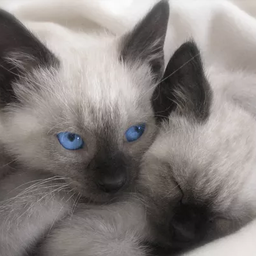

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/06786.png: 256x256


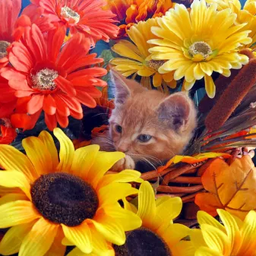

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/02303.png: 256x256


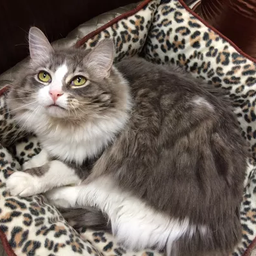

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/10327.png: 256x256


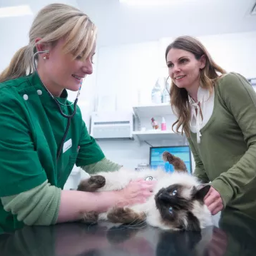

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/15545.png: 256x256


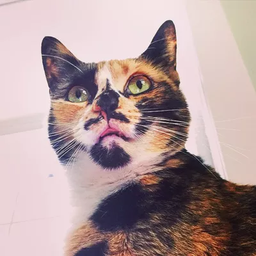

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/18664.png: 256x256


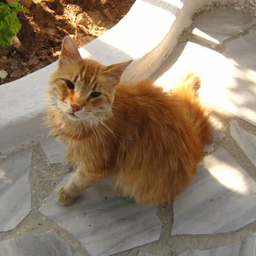

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/02849.png: 256x256


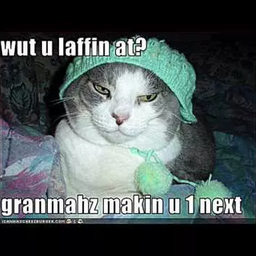

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/06685.png: 256x256


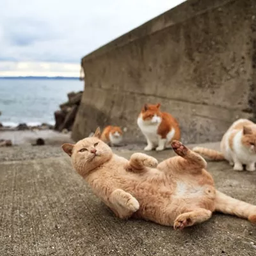

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/19105.png: 256x256


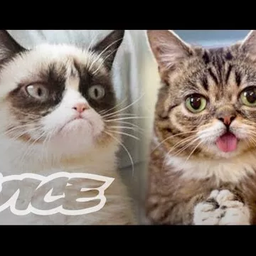

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/00659.png: 256x256


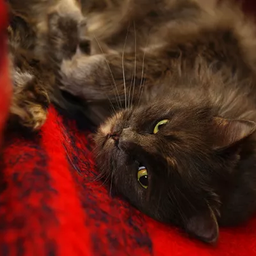

/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real/17132.png: 256x256


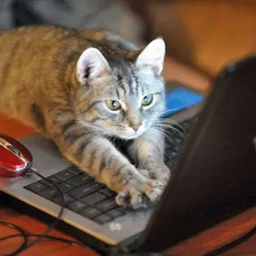

In [ ]:
import os
from google.colab import drive
from PIL import Image


drive.mount('/content/drive')


image_dir = '/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig/cat/0_real'


if not os.path.exists(image_dir):
    print(f"Error: Directory '{image_dir}' not found.")
else:
    image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

    i = 0

    if image_files:
      print("Image files found:")
      for image_file in image_files:
          if(i > 10):
            break
          image_path = os.path.join(image_dir, image_file)
          try:
            img = Image.open(image_path)
            width, height = img.size
            print(f"{image_path}: {width}x{height}")

            display(img)
          except IOError:
            print(f"Error: Cannot open or read image file {image_path}")
          i+=1
    else:
      print("No images found in the specified directory.")


# Basic Unet

In [ ]:
import os
import random
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from google.colab import drive


drive.mount('/content/drive')

# seed
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

#datagen

root_orig = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig"
root_recap = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/recap_monitor"

subfolders = ["cat", "church", "horse"]
subsubfolders = ["0_real", "1_fake"]

def gather_image_pairs(root_original, root_recap, subfolders):
    """
    Gathers (original_path, recaptured_path) pairs by matching filenames
    across the same subfolder (cat, church, horse).
    """
    valid_ext = ('.png', '.jpg', '.jpeg')

    pairs = []
    for sub in subfolders:
      for subsub in subsubfolders:
        orig_sub_path = os.path.join(root_original, sub)
        orig_sub_path = os.path.join(orig_sub_path, subsub)
        recap_sub_path = os.path.join(root_recap, sub)
        recap_sub_path = os.path.join(recap_sub_path, subsub)

        # List files in each subfolder
        orig_fnames = sorted([
            f for f in os.listdir(orig_sub_path)
            if f.lower().endswith(valid_ext)
        ])
        recap_fnames = sorted([
            f for f in os.listdir(recap_sub_path)
            if f.lower().endswith(valid_ext)
        ])

        # Build a dict for recaptured for quick matching
        recap_dict = {f: os.path.join(recap_sub_path, f) for f in recap_fnames}

        # For each file in the original subfolder, see if there's a match in recaptured
        for fname in orig_fnames:
            if fname in recap_dict:
                orig_full = os.path.join(orig_sub_path, fname)
                recap_full = recap_dict[fname]
                pairs.append((orig_full, recap_full))
            else:
                print(f"Warning: no matching recaptured file for {fname} in subfolder '{sub}'")
    return pairs

filename_pairs = gather_image_pairs(root_orig, root_recap, subfolders)
random.shuffle(filename_pairs)

print(f"Total matched pairs: {len(filename_pairs)}")


split_index = int(0.8 * len(filename_pairs))
train_pairs = filename_pairs[:split_index]
val_pairs   = filename_pairs[split_index:]

print(f"Training pairs: {len(train_pairs)}, Validation pairs: {len(val_pairs)}")

# dataloaders
class OriginalToRecapturedDataset(Dataset):
    def __init__(self, pairs, transform=None):
        """
        pairs: list of (original_image_path, recaptured_image_path)
        transform: torchvision transform (resize, to_tensor, etc.)
        """
        self.pairs = pairs
        self.transform = transform

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        orig_path, recap_path = self.pairs[idx]

        orig_img = Image.open(orig_path).convert('RGB')
        recap_img = Image.open(recap_path).convert('RGB')

        if self.transform:
            orig_img = self.transform(orig_img)
            recap_img = self.transform(recap_img)

        return orig_img, recap_img


# resize output to 560x560
IMG_HEIGHT = 560
IMG_WIDTH  = 560
BATCH_SIZE = 8
EPOCHS = 20

transform = T.Compose([
    T.Resize((IMG_HEIGHT, IMG_WIDTH)),
    T.ToTensor(),
])

train_dataset = OriginalToRecapturedDataset(train_pairs, transform=transform)
val_dataset   = OriginalToRecapturedDataset(val_pairs, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)

# UNET BABYYY
class DoubleConv(nn.Module):
    """(Conv2D -> ReLU -> Conv2D -> ReLU)"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        """
        in_channels: number of channels in input images (RGB=3)
        out_channels: number of channels in output (RGB=3)
        """
        super(UNet, self).__init__()

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder
        self.down1 = DoubleConv(in_channels, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)

        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        d1 = self.down1(x)      # (N, 64, H, W)
        p1 = self.maxpool(d1)   # (N, 64, H/2, W/2)
        d2 = self.down2(p1)     # (N, 128, H/2, W/2)
        p2 = self.maxpool(d2)   # (N, 128, H/4, W/4)
        d3 = self.down3(p2)     # (N, 256, H/4, W/4)
        p3 = self.maxpool(d3)   # (N, 256, H/8, W/8)
        d4 = self.down4(p3)     # (N, 512, H/8, W/8)
        p4 = self.maxpool(d4)   # (N, 512, H/16, W/16)

        # Bottleneck
        b = self.bottleneck(p4) # (N, 1024, H/16, W/16)

        # Decoder
        up_4 = self.up4(b)                    # (N, 512, H/8, W/8)
        cat_4 = torch.cat([up_4, d4], dim=1)  # (N, 1024, H/8, W/8)
        dec_4 = self.dec4(cat_4)              # (N, 512, H/8, W/8)

        up_3 = self.up3(dec_4)                # (N, 256, H/4, W/4)
        cat_3 = torch.cat([up_3, d3], dim=1)  # (N, 512, H/4, W/4)
        dec_3 = self.dec3(cat_3)              # (N, 256, H/4, W/4)

        up_2 = self.up2(dec_3)                # (N, 128, H/2, W/2)
        cat_2 = torch.cat([up_2, d2], dim=1)  # (N, 256, H/2, W/2)
        dec_2 = self.dec2(cat_2)              # (N, 128, H/2, W/2)

        up_1 = self.up1(dec_2)                # (N, 64, H, W)
        cat_1 = torch.cat([up_1, d1], dim=1)  # (N, 128, H, W)
        dec_1 = self.dec1(cat_1)              # (N, 64, H, W)

        out = self.out(dec_1)                 # (N, out_channels, H, W)
        return out

model = UNet(in_channels=3, out_channels=3).to(device)

# L1 or MSE
criterion = nn.MSELoss() # nn.L1Loss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for images, targets in loader:
        images = images.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)

            outputs = model(images)
            loss = criterion(outputs, targets)
            running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

for epoch in range(1, EPOCHS + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss   = validate_one_epoch(model, val_loader, criterion, device)

    print(f"Epoch [{epoch}/{EPOCHS}]: Train Loss = {train_loss:.4f}, Val Loss = {val_loss:.4f}")


save_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/unet_recap_chimera.pth"
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda
Total matched pairs: 1200
Training pairs: 960, Validation pairs: 240
Epoch [1/20]: Train Loss = 0.0692, Val Loss = 0.0139
Epoch [2/20]: Train Loss = 0.0098, Val Loss = 0.0067
Epoch [3/20]: Train Loss = 0.0060, Val Loss = 0.0057
Epoch [4/20]: Train Loss = 0.0050, Val Loss = 0.0045
Epoch [5/20]: Train Loss = 0.0044, Val Loss = 0.0043
Epoch [6/20]: Train Loss = 0.0042, Val Loss = 0.0044
Epoch [7/20]: Train Loss = 0.0041, Val Loss = 0.0043
Epoch [8/20]: Train Loss = 0.0039, Val Loss = 0.0039
Epoch [9/20]: Train Loss = 0.0038, Val Loss = 0.0037
Epoch [10/20]: Train Loss = 0.0036, Val Loss = 0.0035
Epoch [11/20]: Train Loss = 0.0034, Val Loss = 0.0034
Epoch [12/20]: Train Loss = 0.0033, Val Loss = 0.0034
Epoch [13/20]: Train Loss = 0.0032, Val Loss = 0.0032
Epoch [14/20]: Train Loss = 0.0031, Val Loss = 0.0031
Epoch [15/20]: Train Loss = 0.0030, 

# Viewing Eval

In [ ]:
model = UNet(in_channels=3, out_channels=3).to(device)

load_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/unet_recap_chimera.pth"
model.load_state_dict(torch.load(load_path, map_location=device))
model.eval()
print("Model loaded and set to eval mode.")

Model loaded and set to eval mode.


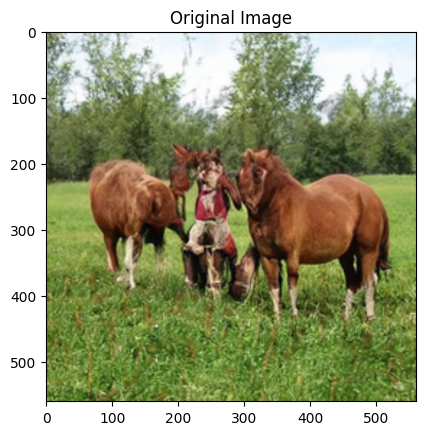

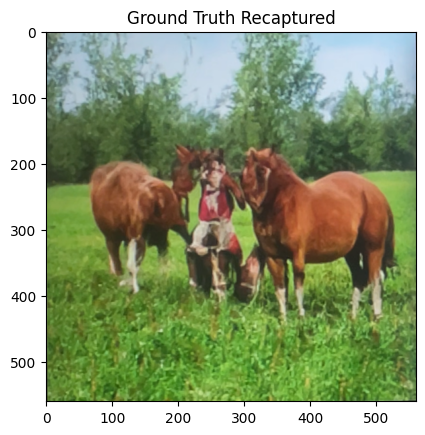

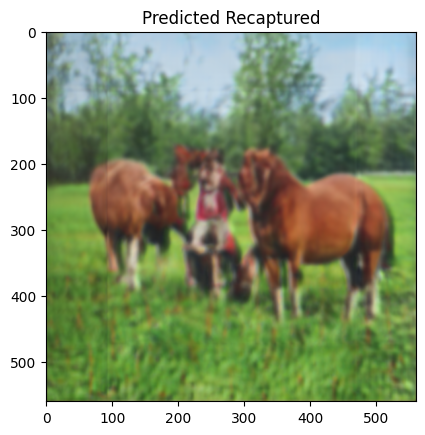

In [ ]:
import matplotlib.pyplot as plt

sample_idx = 0


original_img, target_img = val_dataset[sample_idx]

original_img_batch = original_img.unsqueeze(0).to(device)

model.eval()
with torch.no_grad():
    predicted_img_batch = model(original_img_batch)


predicted_img = predicted_img_batch.squeeze(0).cpu()

orig_np = original_img.permute(1,2,0).numpy()
tgt_np  = target_img.permute(1,2,0).numpy()
pred_np = predicted_img.permute(1,2,0).numpy()

plt.imshow(orig_np)
plt.title("Original Image")
plt.show()

plt.imshow(tgt_np)
plt.title("Ground Truth Recaptured")
plt.show()

plt.imshow(pred_np)
plt.title("Predicted Recaptured")
plt.show()


# Basic Unet with Focal Frequency Loss

In [ ]:
!pip install focal-frequency-loss

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 91.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 84.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 97.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

In [ ]:
import os
import random
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from focal_frequency_loss import FocalFrequencyLoss as FFL

from google.colab import drive


drive.mount('/content/drive')

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

root_orig = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig"
root_recap = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/recap_monitor"

subfolders = ["cat", "church", "horse"]
subsubfolders = ["0_real", "1_fake"]

def gather_image_pairs(root_original, root_recap, subfolders):
    """
    Gathers (original_path, recaptured_path) pairs by matching filenames
    across the same subfolder (cat, church, horse).
    """
    valid_ext = ('.png', '.jpg', '.jpeg')

    pairs = []
    for sub in subfolders:
      for subsub in subsubfolders:
        orig_sub_path = os.path.join(root_original, sub)
        orig_sub_path = os.path.join(orig_sub_path, subsub)
        recap_sub_path = os.path.join(root_recap, sub)
        recap_sub_path = os.path.join(recap_sub_path, subsub)


        orig_fnames = sorted([
            f for f in os.listdir(orig_sub_path)
            if f.lower().endswith(valid_ext)
        ])
        recap_fnames = sorted([
            f for f in os.listdir(recap_sub_path)
            if f.lower().endswith(valid_ext)
        ])


        recap_dict = {f: os.path.join(recap_sub_path, f) for f in recap_fnames}


        for fname in orig_fnames:
            if fname in recap_dict:
                orig_full = os.path.join(orig_sub_path, fname)
                recap_full = recap_dict[fname]
                pairs.append((orig_full, recap_full))
            else:
                print(f"Warning: no matching recaptured file for {fname} in subfolder '{sub}'")
    return pairs

filename_pairs = gather_image_pairs(root_orig, root_recap, subfolders)
random.shuffle(filename_pairs)

print(f"Total matched pairs: {len(filename_pairs)}")


split_index = int(0.8 * len(filename_pairs))
train_pairs = filename_pairs[:split_index]
val_pairs   = filename_pairs[split_index:]

print(f"Training pairs: {len(train_pairs)}, Validation pairs: {len(val_pairs)}")


class OriginalToRecapturedDataset(Dataset):
    def __init__(self, pairs, transform=None):
        """
        pairs: list of (original_image_path, recaptured_image_path)
        transform: torchvision transform (resize, to_tensor, etc.)
        """
        self.pairs = pairs
        self.transform = transform

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        orig_path, recap_path = self.pairs[idx]

        orig_img = Image.open(orig_path).convert('RGB')
        recap_img = Image.open(recap_path).convert('RGB')

        if self.transform:
            orig_img = self.transform(orig_img)
            recap_img = self.transform(recap_img)

        return orig_img, recap_img



IMG_HEIGHT = 560
IMG_WIDTH  = 560
BATCH_SIZE = 8
EPOCHS = 20

transform = T.Compose([
    T.Resize((IMG_HEIGHT, IMG_WIDTH)),
    T.ToTensor(),

])

train_dataset = OriginalToRecapturedDataset(train_pairs, transform=transform)
val_dataset   = OriginalToRecapturedDataset(val_pairs, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)


class DoubleConv(nn.Module):
    """(Conv2D -> ReLU -> Conv2D -> ReLU)"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        """
        in_channels: number of channels in input images (RGB=3)
        out_channels: number of channels in output (RGB=3)
        """
        super(UNet, self).__init__()

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder
        self.down1 = DoubleConv(in_channels, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)

        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        d1 = self.down1(x)      # (N, 64, H, W)
        p1 = self.maxpool(d1)   # (N, 64, H/2, W/2)
        d2 = self.down2(p1)     # (N, 128, H/2, W/2)
        p2 = self.maxpool(d2)   # (N, 128, H/4, W/4)
        d3 = self.down3(p2)     # (N, 256, H/4, W/4)
        p3 = self.maxpool(d3)   # (N, 256, H/8, W/8)
        d4 = self.down4(p3)     # (N, 512, H/8, W/8)
        p4 = self.maxpool(d4)   # (N, 512, H/16, W/16)

        # Bottleneck
        b = self.bottleneck(p4) # (N, 1024, H/16, W/16)

        # Decoder
        up_4 = self.up4(b)                    # (N, 512, H/8, W/8)
        cat_4 = torch.cat([up_4, d4], dim=1)  # (N, 1024, H/8, W/8)
        dec_4 = self.dec4(cat_4)              # (N, 512, H/8, W/8)

        up_3 = self.up3(dec_4)                # (N, 256, H/4, W/4)
        cat_3 = torch.cat([up_3, d3], dim=1)  # (N, 512, H/4, W/4)
        dec_3 = self.dec3(cat_3)              # (N, 256, H/4, W/4)

        up_2 = self.up2(dec_3)                # (N, 128, H/2, W/2)
        cat_2 = torch.cat([up_2, d2], dim=1)  # (N, 256, H/2, W/2)
        dec_2 = self.dec2(cat_2)              # (N, 128, H/2, W/2)

        up_1 = self.up1(dec_2)                # (N, 64, H, W)
        cat_1 = torch.cat([up_1, d1], dim=1)  # (N, 128, H, W)
        dec_1 = self.dec1(cat_1)              # (N, 64, H, W)

        out = self.out(dec_1)                 # (N, out_channels, H, W)
        return out

model = UNet(in_channels=3, out_channels=3).to(device)


criterion = nn.MSELoss() # nn.L1Loss()
ffl = FFL(loss_weight=1.0, alpha=1.0)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for images, targets in loader:
        images = images.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, targets) + ffl(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)

            outputs = model(images)
            loss = criterion(outputs, targets)
            running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

for epoch in range(1, EPOCHS + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss   = validate_one_epoch(model, val_loader, criterion, device)

    print(f"Epoch [{epoch}/{EPOCHS}]: Train Loss = {train_loss:.4f}, Val Loss = {val_loss:.4f}")


save_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/unet_recap_chimera.pth"
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda
Total matched pairs: 1200
Training pairs: 960, Validation pairs: 240
Epoch [1/20]: Train Loss = 0.1407, Val Loss = 0.0148
Epoch [2/20]: Train Loss = 0.0167, Val Loss = 0.0085
Epoch [3/20]: Train Loss = 0.0089, Val Loss = 0.0062
Epoch [4/20]: Train Loss = 0.0071, Val Loss = 0.0052
Epoch [5/20]: Train Loss = 0.0059, Val Loss = 0.0046
Epoch [6/20]: Train Loss = 0.0054, Val Loss = 0.0047
Epoch [7/20]: Train Loss = 0.0052, Val Loss = 0.0046
Epoch [8/20]: Train Loss = 0.0050, Val Loss = 0.0041
Epoch [9/20]: Train Loss = 0.0050, Val Loss = 0.0040
Epoch [10/20]: Train Loss = 0.0048, Val Loss = 0.0039
Epoch [11/20]: Train Loss = 0.0045, Val Loss = 0.0039
Epoch [12/20]: Train Loss = 0.0044, Val Loss = 0.0037
Epoch [13/20]: Train Loss = 0.0041, Val Loss = 0.0035
Epoch [14/20]: Train Loss = 0.0040, Val Loss = 0.0036
Epoch [15/20]: Train Loss = 0.0040, 

# 1. Basic Unet with data augmentation

In [ ]:
import os
import random
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from google.colab import drive


SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


root_orig = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig"
root_recap = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/recap_monitor"

subfolders = ["cat", "church", "horse"]
subsubfolders = ["0_real", "1_fake"]

def gather_image_pairs(root_original, root_recap, subfolders):
    """
    Gathers (original_path, recaptured_path) pairs by matching filenames
    across the same subfolder (cat, church, horse).
    """
    valid_ext = ('.png', '.jpg', '.jpeg')

    pairs = []
    for sub in subfolders:
      for subsub in subsubfolders:
        orig_sub_path = os.path.join(root_original, sub)
        orig_sub_path = os.path.join(orig_sub_path, subsub)
        recap_sub_path = os.path.join(root_recap, sub)
        recap_sub_path = os.path.join(recap_sub_path, subsub)

        # List files in each subfolder
        orig_fnames = sorted([
            f for f in os.listdir(orig_sub_path)
            if f.lower().endswith(valid_ext)
        ])
        recap_fnames = sorted([
            f for f in os.listdir(recap_sub_path)
            if f.lower().endswith(valid_ext)
        ])

        # Build a dict for recaptured for quick matching
        recap_dict = {f: os.path.join(recap_sub_path, f) for f in recap_fnames}

        # For each file in the original subfolder, see if there's a match in recaptured
        for fname in orig_fnames:
            if fname in recap_dict:
                orig_full = os.path.join(orig_sub_path, fname)
                recap_full = recap_dict[fname]
                pairs.append((orig_full, recap_full))
            else:
                print(f"Warning: no matching recaptured file for {fname} in subfolder '{sub}'")
    return pairs

filename_pairs = gather_image_pairs(root_orig, root_recap, subfolders)
random.shuffle(filename_pairs)

print(f"Total matched pairs: {len(filename_pairs)}")

split_index = int(0.8 * len(filename_pairs))
train_pairs = filename_pairs[:split_index]
val_pairs   = filename_pairs[split_index:]

print(f"Training pairs: {len(train_pairs)}, Validation pairs: {len(val_pairs)}")

class OriginalToRecapturedDataset(Dataset):
    def __init__(self, pairs, transform=None, augment_transform=None, augmentation_factor=1):
        self.pairs = pairs
        self.transform = transform
        self.augment_transform = augment_transform
        self.augmentation_factor = augmentation_factor

        # Actual length will be original pairs * augmentation_factor
        self.total_samples = len(pairs) * augmentation_factor

    def __len__(self):
        return self.total_samples

    def __getitem__(self, idx):
        # Map the augmented index back to the original pair
        pair_idx = idx // self.augmentation_factor
        aug_idx = idx % self.augmentation_factor

        orig_path, recap_path = self.pairs[pair_idx]

        orig_img = Image.open(orig_path).convert('RGB')
        recap_img = Image.open(recap_path).convert('RGB')

        # Apply base transformations like resize if specified
        if self.transform:
            orig_img = self.transform(orig_img)
            recap_img = self.transform(recap_img)

        # Apply augmentations for all indices except 0 (keep one original version)
        if aug_idx > 0 and self.augment_transform is not None:
            # Create a seed to ensure the same random augmentation is applied to both images
            seed = torch.randint(0, 2**32, (1,)).item()

            # Apply the same augmentation to both images
            torch.manual_seed(seed)
            orig_img = self.augment_transform(orig_img)

            torch.manual_seed(seed)
            recap_img = self.augment_transform(recap_img)

        return orig_img, recap_img


IMG_HEIGHT = 560
IMG_WIDTH = 560
BATCH_SIZE = 8
EPOCHS = 20
AUGMENTATION_FACTOR = 5  # Create 5 versions of each image pair (1 original + 4 augmented)

# Base transform (applied to all images)
base_transform = T.Compose([
    T.Resize((IMG_HEIGHT, IMG_WIDTH)),
    T.ToTensor(),
])

# Augmentation transform (applied pairwise to create additional samples)
augment_transform = T.Compose([
    T.RandomHorizontalFlip(p=0.5),

    # Apply random rotation
    T.RandomRotation(degrees=10),



    T.RandomResizedCrop(
        size=(IMG_HEIGHT, IMG_WIDTH),
        scale=(0.85, 1.0),  # Don't crop too much
        ratio=(0.9, 1.1)
    ),
])

train_dataset = OriginalToRecapturedDataset(
    train_pairs,
    transform=base_transform,
    augment_transform=augment_transform,
    augmentation_factor=AUGMENTATION_FACTOR
)

val_dataset = OriginalToRecapturedDataset(
    val_pairs,
    transform=base_transform,

    augment_transform=None,
    augmentation_factor=1
)

print(f"Original training pairs: {len(train_pairs)}")
print(f"Augmented training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)


class DoubleConv(nn.Module):
    """(Conv2D -> ReLU -> Conv2D -> ReLU)"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        """
        in_channels: number of channels in input images (RGB=3)
        out_channels: number of channels in output (RGB=3)
        """
        super(UNet, self).__init__()

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder
        self.down1 = DoubleConv(in_channels, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)

        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        d1 = self.down1(x)      # (N, 64, H, W)
        p1 = self.maxpool(d1)   # (N, 64, H/2, W/2)
        d2 = self.down2(p1)     # (N, 128, H/2, W/2)
        p2 = self.maxpool(d2)   # (N, 128, H/4, W/4)
        d3 = self.down3(p2)     # (N, 256, H/4, W/4)
        p3 = self.maxpool(d3)   # (N, 256, H/8, W/8)
        d4 = self.down4(p3)     # (N, 512, H/8, W/8)
        p4 = self.maxpool(d4)   # (N, 512, H/16, W/16)

        # Bottleneck
        b = self.bottleneck(p4) # (N, 1024, H/16, W/16)

        # Decoder
        up_4 = self.up4(b)                    # (N, 512, H/8, W/8)
        cat_4 = torch.cat([up_4, d4], dim=1)  # (N, 1024, H/8, W/8)
        dec_4 = self.dec4(cat_4)              # (N, 512, H/8, W/8)

        up_3 = self.up3(dec_4)                # (N, 256, H/4, W/4)
        cat_3 = torch.cat([up_3, d3], dim=1)  # (N, 512, H/4, W/4)
        dec_3 = self.dec3(cat_3)              # (N, 256, H/4, W/4)

        up_2 = self.up2(dec_3)                # (N, 128, H/2, W/2)
        cat_2 = torch.cat([up_2, d2], dim=1)  # (N, 256, H/2, W/2)
        dec_2 = self.dec2(cat_2)              # (N, 128, H/2, W/2)

        up_1 = self.up1(dec_2)                # (N, 64, H, W)
        cat_1 = torch.cat([up_1, d1], dim=1)  # (N, 128, H, W)
        dec_1 = self.dec1(cat_1)              # (N, 64, H, W)

        out = self.out(dec_1)                 # (N, out_channels, H, W)
        return out


model = UNet(in_channels=3, out_channels=3).to(device)

# Simple pixel-wise loss: L1 or MSE
criterion = nn.L1Loss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    total_samples = 0

    for images, targets in loader:
        images = images.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        batch_size = images.size(0)
        running_loss += loss.item() * batch_size
        total_samples += batch_size

    epoch_loss = running_loss / total_samples
    return epoch_loss

def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    total_samples = 0

    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)

            outputs = model(images)
            loss = criterion(outputs, targets)

            batch_size = images.size(0)
            running_loss += loss.item() * batch_size
            total_samples += batch_size

    epoch_loss = running_loss / total_samples
    return epoch_loss


print(f"Training with augmentation factor: {AUGMENTATION_FACTOR}")


for epoch in range(1, EPOCHS + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss = validate_one_epoch(model, val_loader, criterion, device)

    print(f"Epoch [{epoch}/{EPOCHS}]: Train Loss = {train_loss:.4f}, Val Loss = {val_loss:.4f}")


save_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/unet_recap_chimera_augmented.pth"
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")


import json
config = {
    "img_size": (IMG_HEIGHT, IMG_WIDTH),
    "batch_size": BATCH_SIZE,
    "epochs": EPOCHS,
    "augmentation_factor": AUGMENTATION_FACTOR,
    "original_train_pairs": len(train_pairs),
    "augmented_train_samples": len(train_dataset),
    "val_samples": len(val_dataset)
}

config_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/training_config.json"
with open(config_path, 'w') as f:
    json.dump(config, f, indent=4)
print(f"Training configuration saved to {config_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda
Total matched pairs: 1200
Training pairs: 960, Validation pairs: 240
Original training pairs: 960
Augmented training samples: 4800
Validation samples: 240
Training with augmentation factor: 5
Epoch [1/100]: Train Loss = 0.0833, Val Loss = 0.0525
Epoch [2/100]: Train Loss = 0.0548, Val Loss = 0.0504
Epoch [3/100]: Train Loss = 0.0525, Val Loss = 0.0448
Epoch [4/100]: Train Loss = 0.0514, Val Loss = 0.0462
Epoch [5/100]: Train Loss = 0.0502, Val Loss = 0.0445
Epoch [6/100]: Train Loss = 0.0493, Val Loss = 0.0424
Epoch [7/100]: Train Loss = 0.0490, Val Loss = 0.0426
Epoch [8/100]: Train Loss = 0.0487, Val Loss = 0.0423


KeyboardInterrupt: 

# Reversed Basic Unet

In [ ]:
root_orig = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig"
root_recap = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/recap_monitor"

subfolders = ["cat", "church", "horse"]
subsubfolders = ["0_real", "1_fake"]

def gather_image_pairs(root_original, root_recap, subfolders):
    """
    Gathers (original_path, recaptured_path) pairs by matching filenames
    across the same subfolder (cat, church, horse).
    """
    valid_ext = ('.png', '.jpg', '.jpeg')

    pairs = []
    for sub in subfolders:
      for subsub in subsubfolders:
        orig_sub_path = os.path.join(root_original, sub)
        orig_sub_path = os.path.join(orig_sub_path, subsub)
        recap_sub_path = os.path.join(root_recap, sub)
        recap_sub_path = os.path.join(recap_sub_path, subsub)

        # List files in each subfolder
        orig_fnames = sorted([
            f for f in os.listdir(orig_sub_path)
            if f.lower().endswith(valid_ext)
        ])
        recap_fnames = sorted([
            f for f in os.listdir(recap_sub_path)
            if f.lower().endswith(valid_ext)
        ])


        recap_dict = {f: os.path.join(recap_sub_path, f) for f in recap_fnames}


        for fname in orig_fnames:
            if fname in recap_dict:
                orig_full = os.path.join(orig_sub_path, fname)
                recap_full = recap_dict[fname]
                pairs.append((orig_full, recap_full))
            else:
                print(f"Warning: no matching recaptured file for {fname} in subfolder '{sub}'")
    return pairs

filename_pairs = gather_image_pairs(root_recap, root_orig, subfolders) # flip to go from recap to orig
random.shuffle(filename_pairs)

print(f"Total matched pairs: {len(filename_pairs)}")

split_index = int(0.8 * len(filename_pairs))
train_pairs = filename_pairs[:split_index]
val_pairs   = filename_pairs[split_index:]

print(f"Training pairs: {len(train_pairs)}, Validation pairs: {len(val_pairs)}")


class OriginalToRecapturedDataset(Dataset):
    def __init__(self, pairs, transform=None):
        """
        pairs: list of (original_image_path, recaptured_image_path)
        transform: torchvision transform (resize, to_tensor, etc.)
        """
        self.pairs = pairs
        self.transform = transform

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        orig_path, recap_path = self.pairs[idx]

        orig_img = Image.open(orig_path).convert('RGB')
        recap_img = Image.open(recap_path).convert('RGB')

        if self.transform:
            orig_img = self.transform(orig_img)
            recap_img = self.transform(recap_img)

        return orig_img, recap_img


IMG_HEIGHT = 560
IMG_WIDTH  = 560
BATCH_SIZE = 8
EPOCHS = 20

transform = T.Compose([
    T.Resize((IMG_HEIGHT, IMG_WIDTH)),
    T.ToTensor(),
])

train_dataset = OriginalToRecapturedDataset(train_pairs, transform=transform)
val_dataset   = OriginalToRecapturedDataset(val_pairs, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        """
        in_channels: number of channels in input images (RGB=3)
        out_channels: number of channels in output (RGB=3)
        """
        super(UNet, self).__init__()

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder
        self.down1 = DoubleConv(in_channels, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)

        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        d1 = self.down1(x)      # (N, 64, H, W)
        p1 = self.maxpool(d1)   # (N, 64, H/2, W/2)
        d2 = self.down2(p1)     # (N, 128, H/2, W/2)
        p2 = self.maxpool(d2)   # (N, 128, H/4, W/4)
        d3 = self.down3(p2)     # (N, 256, H/4, W/4)
        p3 = self.maxpool(d3)   # (N, 256, H/8, W/8)
        d4 = self.down4(p3)     # (N, 512, H/8, W/8)
        p4 = self.maxpool(d4)   # (N, 512, H/16, W/16)

        # Bottleneck
        b = self.bottleneck(p4) # (N, 1024, H/16, W/16)

        # Decoder
        up_4 = self.up4(b)                    # (N, 512, H/8, W/8)
        cat_4 = torch.cat([up_4, d4], dim=1)  # (N, 1024, H/8, W/8)
        dec_4 = self.dec4(cat_4)              # (N, 512, H/8, W/8)

        up_3 = self.up3(dec_4)                # (N, 256, H/4, W/4)
        cat_3 = torch.cat([up_3, d3], dim=1)  # (N, 512, H/4, W/4)
        dec_3 = self.dec3(cat_3)              # (N, 256, H/4, W/4)

        up_2 = self.up2(dec_3)                # (N, 128, H/2, W/2)
        cat_2 = torch.cat([up_2, d2], dim=1)  # (N, 256, H/2, W/2)
        dec_2 = self.dec2(cat_2)              # (N, 128, H/2, W/2)

        up_1 = self.up1(dec_2)                # (N, 64, H, W)
        cat_1 = torch.cat([up_1, d1], dim=1)  # (N, 128, H, W)
        dec_1 = self.dec1(cat_1)              # (N, 64, H, W)

        out = self.out(dec_1)                 # (N, out_channels, H, W)
        return out

model = UNet(in_channels=3, out_channels=3).to(device)

criterion = nn.MSELoss() # nn.L1Loss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for images, targets in loader:
        images = images.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)

            outputs = model(images)
            loss = criterion(outputs, targets)
            running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

for epoch in range(1, EPOCHS + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss   = validate_one_epoch(model, val_loader, criterion, device)

    print(f"Epoch [{epoch}/{EPOCHS}]: Train Loss = {train_loss:.4f}, Val Loss = {val_loss:.4f}")

save_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/unet_recap_chimera.pth"
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")


# Invertible UNet Experiment

In [ ]:
import torch

In [ ]:
!pip install iunets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.3/50.3 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.3/52.3 MB 42.6 MB/s eta 0:00:00


In [ ]:
from iunets import iUNet
import inspect

model = iUNet(
    in_channels=3,
    channels=(64,128,256,512,1024,2056),
    architecture=(2,2,2,2,2,2),
    dim=2
).to(device)

In [ ]:

import os
import random
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from google.colab import drive


drive.mount('/content/drive')

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


root_orig = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig"
root_recap = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/recap_monitor"

subfolders = ["cat", "church", "horse"]
subsubfolders = ["0_real", "1_fake"]

def gather_image_pairs(root_original, root_recap, subfolders):
    valid_ext = ('.png', '.jpg', '.jpeg')

    pairs = []
    for sub in subfolders:
      for subsub in subsubfolders:
        orig_sub_path = os.path.join(root_original, sub)
        orig_sub_path = os.path.join(orig_sub_path, subsub)
        recap_sub_path = os.path.join(root_recap, sub)
        recap_sub_path = os.path.join(recap_sub_path, subsub)


        orig_fnames = sorted([
            f for f in os.listdir(orig_sub_path)
            if f.lower().endswith(valid_ext)
        ])
        recap_fnames = sorted([
            f for f in os.listdir(recap_sub_path)
            if f.lower().endswith(valid_ext)
        ])


        recap_dict = {f: os.path.join(recap_sub_path, f) for f in recap_fnames}


        for fname in orig_fnames:
            if fname in recap_dict:
                orig_full = os.path.join(orig_sub_path, fname)
                recap_full = recap_dict[fname]
                pairs.append((orig_full, recap_full))
            else:

                print(f"Warning: no matching recaptured file for {fname} in subfolder '{sub}'")
    return pairs

filename_pairs = gather_image_pairs(root_orig, root_recap, subfolders)
random.shuffle(filename_pairs)

print(f"Total matched pairs: {len(filename_pairs)}")

split_index = int(0.8 * len(filename_pairs))
train_pairs = filename_pairs[:split_index]
val_pairs   = filename_pairs[split_index:]

print(f"Training pairs: {len(train_pairs)}, Validation pairs: {len(val_pairs)}")

class OriginalToRecapturedDataset(Dataset):
    def __init__(self, pairs, transform=None, augment_transform=None, augmentation_factor=1):
        """
        pairs: list of (original_image_path, recaptured_image_path)
        transform: base torchvision transform (resize, to_tensor, etc.)
        augment_transform: augmentation transforms applied pairwise
        augmentation_factor: how many augmented versions to create per original pair
        """
        self.pairs = pairs
        self.transform = transform
        self.augment_transform = augment_transform
        self.augmentation_factor = augmentation_factor
        self.total_samples = len(pairs) * augmentation_factor

    def __len__(self):
        return self.total_samples

    def __getitem__(self, idx):
        pair_idx = idx // self.augmentation_factor
        aug_idx = idx % self.augmentation_factor

        orig_path, recap_path = self.pairs[pair_idx]

        orig_img = Image.open(orig_path).convert('RGB')
        recap_img = Image.open(recap_path).convert('RGB')

        if self.transform:
            orig_img = self.transform(orig_img)
            recap_img = self.transform(recap_img)


        if aug_idx > 0 and self.augment_transform is not None:
            seed = torch.randint(0, 2**32, (1,)).item()
            torch.manual_seed(seed)
            orig_img = self.augment_transform(orig_img)
            torch.manual_seed(seed)
            recap_img = self.augment_transform(recap_img)

        return orig_img, recap_img


IMG_HEIGHT = 560
IMG_WIDTH = 560
BATCH_SIZE = 8
EPOCHS = 30  # Adjust as needed
AUGMENTATION_FACTOR = 2  # 5 versions of each image pair

# Base transform (applied to all images)
base_transform = T.Compose([
    T.Resize((IMG_HEIGHT, IMG_WIDTH)),
    T.ToTensor(),
])

# Augmentation transform
augment_transform = T.Compose([
    T.RandomHorizontalFlip(p=0.5),
    T.RandomRotation(degrees=10),
    T.RandomResizedCrop(
        size=(IMG_HEIGHT, IMG_WIDTH),
        scale=(0.85, 1.0),
        ratio=(0.9, 1.1)
    ),
])

train_dataset = OriginalToRecapturedDataset(
    train_pairs,
    transform=base_transform,
    augment_transform=augment_transform,
    augmentation_factor=AUGMENTATION_FACTOR
)
val_dataset = OriginalToRecapturedDataset(
    val_pairs,
    transform=base_transform,
    augment_transform=None,
    augmentation_factor=1
)

print(f"Original training pairs: {len(train_pairs)}")
print(f"Augmented training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")


train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=8)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=8)


# Simple pixel-wise loss: L1
criterion = nn.L1Loss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for images, targets in loader:
        images = images.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)

            outputs = model(images)
            loss = criterion(outputs, targets)
            running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

for epoch in range(1, EPOCHS + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss   = validate_one_epoch(model, val_loader, criterion, device)

    print(f"Epoch [{epoch}/{EPOCHS}]: Train Loss = {train_loss:.4f}, Val Loss = {val_loss:.4f}")

save_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/sim_with_invertible_unet.pth"
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda
Total matched pairs: 1200
Training pairs: 960, Validation pairs: 240
Original training pairs: 960
Augmented training samples: 1920
Validation samples: 240
Epoch [1/30]: Train Loss = 0.1578, Val Loss = 0.2210
Epoch [2/30]: Train Loss = 0.2467, Val Loss = 0.2634
Epoch [3/30]: Train Loss = 0.2623, Val Loss = 0.2503
Epoch [4/30]: Train Loss = 0.2470, Val Loss = 0.2368
Epoch [5/30]: Train Loss = 0.2323, Val Loss = 0.2183
Epoch [6/30]: Train Loss = 0.2103, Val Loss = 0.1928
Epoch [7/30]: Train Loss = 0.1871, Val Loss = 0.1723
Epoch [8/30]: Train Loss = 0.1712, Val Loss = 0.1617
Epoch [9/30]: Train Loss = 0.1627, Val Loss = 0.1541
Epoch [10/30]: Train Loss = 0.1533, Val Loss = 0.1446
Epoch [11/30]: Train Loss = 0.1450, Val Loss = 0.1383
Epoch [12/30]: Train Loss = 0.1406, Val Loss = 0.1348
Epoch [13/30]: Train Loss = 0.1373, Val Loss = 0.1321
Epoc

Model loaded and set to eval mode.


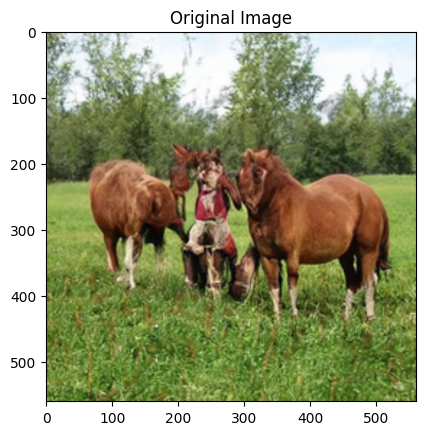

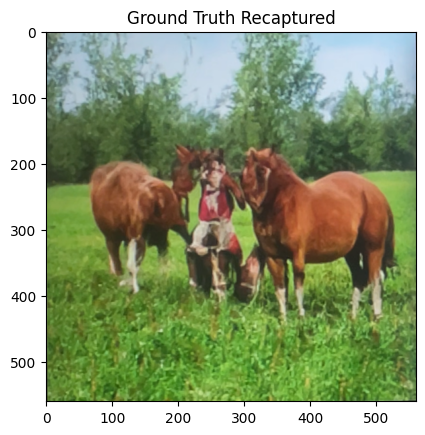

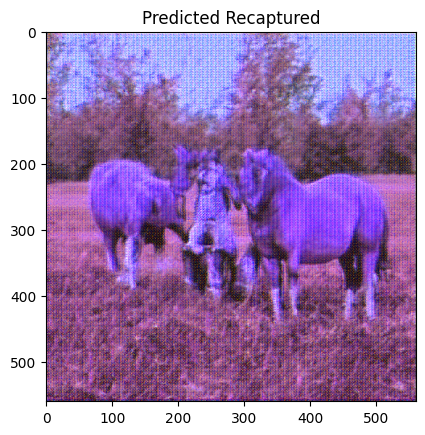

In [ ]:
model = iUNet(
    in_channels=3,
    channels=(64,128,256,512,1024,2056),
    architecture=(2,2,2,2,2,2),
    dim=2
).to(device)

load_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/sim_with_invertible_unet.pth"
model.load_state_dict(torch.load(load_path, map_location=device))
model.eval()
print("Model loaded and set to eval mode.")

import matplotlib.pyplot as plt

sample_idx = 0

original_img, target_img = val_dataset[sample_idx]

original_img_batch = original_img.unsqueeze(0).to(device)
target_img_batch = target_img.unsqueeze(0).to(device)

model.eval()
with torch.no_grad():
    predicted_img_batch = model.inverse(original_img_batch)

# Remove the batch dimension and bring tensor back to CPU
predicted_img = predicted_img_batch.squeeze(0).cpu()

orig_np = original_img.permute(1,2,0).numpy()
tgt_np  = target_img.permute(1,2,0).numpy()
pred_np = predicted_img.permute(1,2,0).numpy()


# Plot the images in separate figures (no subplots)
plt.imshow(orig_np)
plt.title("Original Image")
plt.show()

plt.imshow(tgt_np)
plt.title("Ground Truth Recaptured")
plt.show()

plt.imshow(pred_np)
plt.title("Predicted Recaptured")
plt.show()


# Diffusion UNet

In [ ]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

def linear_beta_schedule(timesteps, start=1e-4, end=2e-2):
    """
    Creates a linearly increasing beta schedule from 'start' to 'end' over 'timesteps'.
    """
    return torch.linspace(start, end, timesteps)

class Diffusion:

    def __init__(self, timesteps=1000, beta_start=1e-4, beta_end=2e-2, device='cuda'):
        self.timesteps = timesteps
        self.betas = linear_beta_schedule(timesteps, start=beta_start, end=beta_end).to(device)
        self.alphas = 1.0 - self.betas
        self.alpha_cumprod = torch.cumprod(self.alphas, dim=0)
        self.alpha_cumprod_prev = F.pad(self.alpha_cumprod[:-1], (1,0), value=1.0)

        self.sqrt_alpha_cumprod = torch.sqrt(self.alpha_cumprod)
        self.sqrt_one_minus_alpha_cumprod = torch.sqrt(1.0 - self.alpha_cumprod)
        self.posterior_variance = self.betas * (1.0 - self.alpha_cumprod_prev) / (1.0 - self.alpha_cumprod)

    def q_sample(self, x_start, t, noise=None):

        if noise is None:
            noise = torch.randn_like(x_start)
        # \sqrt{\bar{\alpha}_t} x_0 + \sqrt{1 - \bar{\alpha}_t} noise
        sqrt_alphas_cumprod_t = self._extract(self.sqrt_alpha_cumprod, t, x_start.shape)
        sqrt_one_minus_alphas_cumprod_t = self._extract(self.sqrt_one_minus_alpha_cumprod, t, x_start.shape)
        return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

    def p_sample(self, model, x, t, original, guidance_scale=1.0):
        """
        Given x_t, sample x_{t-1}.
        'model' predicts the noise in x_t.
        'original' is the original image (conditional input).
        'guidance_scale' can push the model to rely more strongly on the condition.
        """
        betas_t = self._extract(self.betas, t, x.shape)
        sqrt_one_minus_alphas_cumprod_t = self._extract(self.sqrt_one_minus_alpha_cumprod, t, x.shape)
        sqrt_alphas_cumprod_t = self._extract(self.sqrt_alpha_cumprod, t, x.shape)

        # Model predicts noise
        eps = model(x, t, original)

        # x_0 = (x_t - sqrt(1 - alpha_bar_t)*eps) / sqrt(alpha_bar_t)
        x_0 = (x - sqrt_one_minus_alphas_cumprod_t * eps) / (sqrt_alphas_cumprod_t + 1e-7)


        eps_guidance = (1 + guidance_scale) * eps - guidance_scale * eps

        # Compute posterior mean
        posterior_mean = (
            self._extract(self.alphas, t, x.shape)**0.5 *
            (x_0) +
            (1.0 - self._extract(self.alphas, t, x.shape))**0.5 *
            eps_guidance
        )

        # Posterior variance
        posterior_var = self._extract(self.posterior_variance, t, x.shape)

        if (t == 0).all():
            # At t=0, we directly use x_0
            return x_0
        else:
            # Sample from Normal(posterior_mean, posterior_var)
            noise = torch.randn_like(x)
            return posterior_mean + torch.sqrt(posterior_var) * noise

    def _extract(self, a, t, x_shape):
        """
        Extract coefficients a_t for batch of indices t, reshape to x_shape.
        """
        batch_size = t.size(0)
        out = a.gather(-1, t).reshape(batch_size, 1, 1, 1)
        return out.expand(x_shape)

# Time embeddings
class SinusoidalPosEmb(nn.Module):

    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, t):

        device = t.device
        half_dim = self.dim // 2
        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = t.unsqueeze(1) * emb.unsqueeze(0)
        emb = torch.cat([emb.sin(), emb.cos()], dim=-1)
        return emb


class ResidualBlock(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, padding=1)
        self.activation = nn.ReLU()
        self.skip = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x):
        skip = self.skip(x)
        x = self.conv1(x)
        x = self.activation(x)
        x = self.conv2(x)
        x = x + skip
        x = self.activation(x)
        return x

class Downsample(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.down = nn.Conv2d(in_channels, in_channels, 4, 2, 1)

    def forward(self, x):
        return self.down(x)

class Upsample(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels, 4, 2, 1)

    def forward(self, x):
        return self.up(x)

class UNetConditional(nn.Module):

    def __init__(self,
                 c_in=3,       # Channels in (noisy recaptured)
                 c_out=3,      # Channels out (predicted noise)
                 c_cond=3,     # Channels for the conditioning (original image)
                 time_emb_dim=256,
                 hidden_dim=64):
        super().__init__()

        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU()
        )


        self.init_conv = nn.Conv2d(c_in + c_cond, hidden_dim, 3, padding=1)

        # Down
        self.down1 = ResidualBlock(hidden_dim, hidden_dim)
        self.down2 = nn.Sequential(
            Downsample(hidden_dim),
            ResidualBlock(hidden_dim, hidden_dim*2)
        )
        self.down3 = nn.Sequential(
            Downsample(hidden_dim*2),
            ResidualBlock(hidden_dim*2, hidden_dim*4)
        )

        # Bottleneck
        self.bottleneck = ResidualBlock(hidden_dim*4, hidden_dim*4)

        # Up
        self.up1 = nn.Sequential(
            Upsample(hidden_dim*4),
            ResidualBlock(hidden_dim*4, hidden_dim*2)
        )
        self.up2 = nn.Sequential(
            Upsample(hidden_dim*2),
            ResidualBlock(hidden_dim*2, hidden_dim)
        )
        self.up3 = ResidualBlock(hidden_dim, hidden_dim)

        self.final_conv = nn.Conv2d(hidden_dim, c_out, 1)


        self.time_emb_proj = nn.Sequential(
            nn.Linear(time_emb_dim, hidden_dim*4)
        )

    def forward(self, x, t, cond):

        t_emb = self.time_mlp(t.float())  # (B, time_emb_dim)
        t_emb_out = self.time_emb_proj(t_emb).unsqueeze(-1).unsqueeze(-1)

        # Combine x and cond along channel dim
        x_in = torch.cat([x, cond], dim=1)  # shape (B, 3+3, H, W)
        x = self.init_conv(x_in)

        # Down
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)

        # Bottleneck
        b = self.bottleneck(d3 + t_emb_out)

        # Up
        u1 = self.up1(b) + d2
        u2 = self.up2(u1) + d1
        u3 = self.up3(u2)

        # Final
        out = self.final_conv(u3)
        return out


def train_diffusion_model(train_loader, model, diffusion, device='cuda', epochs=10, lr=1e-4):
    """
    Simple training loop for the diffusion model.
    train_loader should yield (original, recaptured) pairs.
    """
    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse = nn.MSELoss()
    model.train()

    for epoch in range(epochs):
        for batch_idx, (original, recaptured) in enumerate(train_loader):
            original = original.to(device)
            recaptured = recaptured.to(device)


            t = torch.randint(0, diffusion.timesteps, (original.size(0),), device=device).long()


            noise = torch.randn_like(recaptured)
            x_noisy = diffusion.q_sample(recaptured, t, noise=noise)
            noise_pred = model(x_noisy, t, original)

            loss = mse(noise_pred, noise)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            if batch_idx % 100 == 0:
                print(f"Epoch [{epoch}/{epochs}] Batch {batch_idx} Loss: {loss.item():.4f}")

    save_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/unet_recap_chimera_diffusion_basic.pth"
    torch.save(model.state_dict(), save_path)
    print(f"Model saved to {save_path}")


@torch.no_grad()
def sample_from_diffusion(model, diffusion, original, device='cuda'):
    """
    Given an original image (B, 3, H, W), sample the recaptured image from pure noise.
    We'll do a loop from t=diffusion.timesteps-1 down to 0.
    """
    model.eval()

    batch_size = original.size(0)
    shape = original.shape
    x = torch.randn(shape, device=device)

    for i in reversed(range(diffusion.timesteps)):
        t = torch.full((batch_size,), i, device=device, dtype=torch.long)
        x = diffusion.p_sample(model, x, t, original, guidance_scale=1.0)

    # x should now be an estimate of the recaptured image
    return x



device = "cuda" if torch.cuda.is_available() else "cpu"


model = UNetConditional(
    c_in=3,
    c_out=3,
    c_cond=3,
    time_emb_dim=256,
    hidden_dim=64
).to(device)

diffusion = Diffusion(
    timesteps=1000,
    beta_start=1e-4,
    beta_end=0.02,
    device=device
)

train_diffusion_model(train_loader, model, diffusion, device=device, epochs=10, lr=1e-4)


print("Diffusion U-Net definition complete.")


Epoch [0/10] Batch 0 Loss: 1.0342
Epoch [0/10] Batch 100 Loss: 0.2794
Epoch [0/10] Batch 200 Loss: 0.3633
Epoch [0/10] Batch 300 Loss: 0.0215
Epoch [0/10] Batch 400 Loss: 0.0813
Epoch [1/10] Batch 0 Loss: 0.0166
Epoch [1/10] Batch 100 Loss: 0.0199
Epoch [1/10] Batch 200 Loss: 0.0354
Epoch [1/10] Batch 300 Loss: 0.0211
Epoch [1/10] Batch 400 Loss: 0.0166
Epoch [2/10] Batch 0 Loss: 0.0330
Epoch [2/10] Batch 100 Loss: 0.0264
Epoch [2/10] Batch 200 Loss: 0.3086
Epoch [2/10] Batch 300 Loss: 0.0488
Epoch [2/10] Batch 400 Loss: 0.0142
Epoch [3/10] Batch 0 Loss: 0.0099
Epoch [3/10] Batch 100 Loss: 0.0114
Epoch [3/10] Batch 200 Loss: 0.0123
Epoch [3/10] Batch 300 Loss: 0.0158
Epoch [3/10] Batch 400 Loss: 0.0174
Epoch [4/10] Batch 0 Loss: 0.0193
Epoch [4/10] Batch 100 Loss: 0.0109
Epoch [4/10] Batch 200 Loss: 0.0079
Epoch [4/10] Batch 300 Loss: 0.0228
Epoch [4/10] Batch 400 Loss: 0.0078
Epoch [5/10] Batch 0 Loss: 0.0111
Epoch [5/10] Batch 100 Loss: 0.0078
Epoch [5/10] Batch 200 Loss: 0.0136
Epoc

In [ ]:
original_batch = next(iter(train_loader))[0]  # get a batch of original
original_batch = original_batch.to(device)

with torch.no_grad():
    recaptured_samples = sample_from_diffusion(model, diffusion, original_batch, device=device)

import matplotlib.pyplot as plt


num_to_show = 2

for i in range(num_to_show):

    image_tensor = recaptured_samples[i].detach().cpu()

    print(image_tensor)


    # image_tensor = (image_tensor.clamp(-1, 1) + 1) / 2
    # image_np = image_tensor.permute(1, 2, 0).numpy()



    # plt.figure()
    # plt.imshow(image_np)
    # plt.title(f"Sample {i}")
    # plt.axis("off")
    # plt.show()


tensor([[[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         ...,
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan]],

        [[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         ...,
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan]],

        [[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         ...,
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan]]])
tensor([[[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [na

# Bigger Diffusion UNet

In [ ]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader


def linear_beta_schedule(timesteps, beta_start=1e-4, beta_end=2e-2):
    """
    Creates a linearly increasing beta schedule from 'start' to 'end' over 'timesteps'.
    """
    return torch.linspace(beta_start, beta_end, timesteps)

class Diffusion:
    """
    Manages forward (q_sample) and reverse (p_sample) diffusion processes.
    """
    def __init__(self, timesteps=1000, beta_start=1e-4, beta_end=0.02, device="cuda"):
        self.timesteps = timesteps
        self.device = device
        self.betas = linear_beta_schedule(timesteps, beta_start, beta_end).to(device)

        self.alphas = 1.0 - self.betas
        self.alpha_cumprod = torch.cumprod(self.alphas, dim=0)
        self.alpha_cumprod_prev = F.pad(self.alpha_cumprod[:-1], (1,0), value=1.0)

        self.sqrt_alpha_cumprod = torch.sqrt(self.alpha_cumprod)
        self.sqrt_one_minus_alpha_cumprod = torch.sqrt(1.0 - self.alpha_cumprod)
        self.posterior_variance = self.betas * (1.0 - self.alpha_cumprod_prev) / (1.0 - self.alpha_cumprod)

    def _extract(self, arr, t, x_shape):
        """
        Extract values from a 1-D 'arr' (length = timesteps) at indices t into a batch shape.
        """
        batch_size = t.size(0)
        out = arr.gather(-1, t).reshape(batch_size, 1, 1, 1)
        return out.expand(x_shape)

    def q_sample(self, x_start, t, noise=None):
        """
        Forward diffusion: produce x_t from x_0 by adding noise according to alpha_cumprod.
        x_start: (B, C, H, W)  (the recaptured image at t=0)
        t: (B,)  integer timesteps
        """
        if noise is None:
            noise = torch.randn_like(x_start)

        sqrt_alpha = self._extract(self.sqrt_alpha_cumprod, t, x_start.shape)
        sqrt_one_minus_alpha = self._extract(self.sqrt_one_minus_alpha_cumprod, t, x_start.shape)

        return sqrt_alpha * x_start + sqrt_one_minus_alpha * noise

    def p_sample(self, model, x, t, original, guidance_scale=1.0):
        betas_t = self._extract(self.betas, t, x.shape)
        sqrt_alpha = self._extract(self.sqrt_alpha_cumprod, t, x.shape)
        sqrt_one_minus_alpha = self._extract(self.sqrt_one_minus_alpha_cumprod, t, x.shape)
        alpha = self._extract(self.alphas, t, x.shape)
        alpha_cumprod_prev = self._extract(self.alpha_cumprod_prev, t, x.shape)
        posterior_var = self._extract(self.posterior_variance, t, x.shape)

        # Predict noise using U-Net
        eps = model(x, t, original)


        eps_guided = (1 + guidance_scale) * eps - guidance_scale * eps

        # Estimate x_0
        x_0 = (x - sqrt_one_minus_alpha * eps_guided) / (sqrt_alpha + 1e-7)

        # Mean of q(x_{t-1} | x_t, x_0)
        mean = (
            torch.sqrt(alpha_cumprod_prev) * x_0 +
            torch.sqrt(1. - alpha_cumprod_prev) * eps_guided
        )


        if (t == 0).all():
            return x_0
        else:
            noise = torch.randn_like(x)
            return mean + torch.sqrt(posterior_var) * noise

class SinusoidalPosEmb(nn.Module):

    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, t):

        device = t.device
        half_dim = self.dim // 2
        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = t.unsqueeze(1) * emb.unsqueeze(0)
        emb = torch.cat([emb.sin(), emb.cos()], dim=-1)
        return emb

class OriginalImageEncoder(nn.Module):

    def __init__(self, in_channels=3, out_channels=64):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size=4, stride=2, padding=1),
            nn.GroupNorm(8, 32),
            nn.SiLU(),
            nn.Conv2d(32, out_channels, kernel_size=4, stride=2, padding=1),
            nn.GroupNorm(8, out_channels),
            nn.SiLU()
        )

    def forward(self, original):
        # returns (B, out_channels, H/4, W/4)
        return self.net(original)


class ResidualBlock(nn.Module):

    def __init__(self, in_channels, out_channels, time_emb_dim=256, use_time=True):
        super().__init__()
        self.use_time = use_time

        self.block1 = nn.Sequential(
            nn.GroupNorm(32, in_channels),
            nn.SiLU(),
            nn.Conv2d(in_channels, out_channels, 3, padding=1)
        )
        self.block2 = nn.Sequential(
            nn.GroupNorm(32, out_channels),
            nn.SiLU(),
            nn.Conv2d(out_channels, out_channels, 3, padding=1)
        )
        self.skip = nn.Conv2d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

        if self.use_time:
            self.time_mlp = nn.Linear(time_emb_dim, out_channels)

    def forward(self, x, t_emb=None):

        h = self.block1(x)
        if self.use_time and t_emb is not None:
            # Inject time embedding as a simple bias
            time_bias = self.time_mlp(t_emb)
            # shape (B, out_channels) -> (B, out_channels, 1, 1)
            h = h + time_bias.unsqueeze(-1).unsqueeze(-1)
        h = self.block2(h)
        return h + self.skip(x)

class AttentionBlock(nn.Module):

    def __init__(self, channels, num_heads=4):
        super().__init__()
        self.norm = nn.GroupNorm(32, channels)
        self.qkv_proj = nn.Conv2d(channels, channels * 3, 1)
        self.out_proj = nn.Conv2d(channels, channels, 1)
        self.num_heads = num_heads

    def forward(self, x):
        """
        x: (B, C, H, W)
        """
        B, C, H, W = x.shape
        h = self.norm(x)

        # Compute q, k, v
        qkv = self.qkv_proj(h)  # (B, 3C, H, W)
        qkv = qkv.reshape(B, 3, self.num_heads, C // self.num_heads, H * W)
        q, k, v = qkv[0], qkv[1], qkv[2]  # each: (B, num_heads, C//num_heads, H*W)

        # Transpose k for matrix multiply
        k = k.transpose(-2, -1)  # (B, num_heads, H*W, C//num_heads)
        attn = torch.matmul(q, k) / (C**0.5 / self.num_heads**0.5)  # (B, num_heads, H*W, H*W)
        attn = F.softmax(attn, dim=-1)

        out = torch.matmul(attn, v)  # (B, num_heads, C//num_heads, H*W)
        out = out.reshape(B, C, H, W)
        out = self.out_proj(out)

        return x + out

class ResAttnBlock(nn.Module):
    """
    Combines a ResidualBlock with optional Self-Attention.
    """
    def __init__(self, in_channels, out_channels, time_emb_dim, use_attn=False, num_heads=4):
        super().__init__()
        self.res_block = ResidualBlock(in_channels, out_channels, time_emb_dim=time_emb_dim)
        self.attn = AttentionBlock(out_channels, num_heads=num_heads) if use_attn else None

    def forward(self, x, t_emb):
        x = self.res_block(x, t_emb)
        if self.attn is not None:
            x = self.attn(x)
        return x

class Downsample(nn.Module):

    def __init__(self, channels):
        super().__init__()
        self.down = nn.Conv2d(channels, channels, 4, 2, 1)

    def forward(self, x):
        return self.down(x)

class Upsample(nn.Module):

    def __init__(self, channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(channels, channels, 4, 2, 1)

    def forward(self, x):
        return self.up(x)

class UNetLargeConditional(nn.Module):

    def __init__(
        self,
        in_channels=3,          # channels of noisy input
        out_channels=3,         # output channels (pred noise)
        cond_channels=3,        # channels for 'original' if used directly
        base_channels=128,
        channel_multipliers=[1,2,4,4],
        num_res_blocks=2,
        time_emb_dim=256,
        use_attention_at=[1],
        num_heads=4,
        use_original_encoder=False
    ):
        super().__init__()
        self.time_emb_dim = time_emb_dim
        self.use_original_encoder = use_original_encoder

        # Time MLP
        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim*4),
            nn.SiLU(),
            nn.Linear(time_emb_dim*4, time_emb_dim)
        )

        # Optional original-image encoder
        if use_original_encoder:
            self.orig_encoder = OriginalImageEncoder(in_channels=cond_channels, out_channels=base_channels)

        # Input convolution

        input_channels = in_channels + (cond_channels if not use_original_encoder else 0)
        self.init_conv = nn.Conv2d(input_channels, base_channels, 3, padding=1)

        # -----------------------
        # Downsampling
        # -----------------------
        self.down_blocks = nn.ModuleList()
        channels_in = base_channels
        for i, mult in enumerate(channel_multipliers):
            out_ch = base_channels * mult
            for _ in range(num_res_blocks):
                self.down_blocks.append(
                    ResAttnBlock(
                        in_channels=channels_in,
                        out_channels=out_ch,
                        time_emb_dim=time_emb_dim,
                        use_attn=(i in use_attention_at),
                        num_heads=num_heads
                    )
                )
                channels_in = out_ch

            if i != len(channel_multipliers) - 1:
                self.down_blocks.append(Downsample(channels_in))

        # Bottleneck
        self.mid_block1 = ResAttnBlock(
            in_channels=channels_in, out_channels=channels_in,
            time_emb_dim=time_emb_dim,
            use_attn=True, num_heads=num_heads
        )
        self.mid_block2 = ResAttnBlock(
            in_channels=channels_in, out_channels=channels_in,
            time_emb_dim=time_emb_dim,
            use_attn=False, num_heads=num_heads
        )

        # -----------------------
        # Upsampling
        # -----------------------
        self.up_blocks = nn.ModuleList()
        for i, mult in reversed(list(enumerate(channel_multipliers))):
            out_ch = base_channels * mult
            for _ in range(num_res_blocks):
                self.up_blocks.append(
                    ResAttnBlock(
                        in_channels=channels_in + out_ch,  # skip connection
                        out_channels=out_ch,
                        time_emb_dim=time_emb_dim,
                        use_attn=(i in use_attention_at),
                        num_heads=num_heads
                    )
                )
                channels_in = out_ch

            if i != 0:
                self.up_blocks.append(Upsample(channels_in))

        # Final
        self.final_norm = nn.GroupNorm(32, channels_in)
        self.final_act = nn.SiLU()
        self.final_conv = nn.Conv2d(channels_in, out_channels, kernel_size=3, padding=1)

    def forward(self, x, t, original):
        """
        x: (B, 3, H, W) => the noisy recaptured image
        t: (B,) => timesteps
        original: (B, 3, H, W) => the original image (conditional input)
        """
        # Time embedding
        t_emb = self.time_mlp(t.float())


        if self.use_original_encoder:
            pass
        else:
            # If not using an encoder, we cat original to x
            x = torch.cat([x, original], dim=1)

        # Initial conv
        x = self.init_conv(x)

        # Downsampling (encoder)
        skips = []
        for block in self.down_blocks:
            if isinstance(block, Downsample):
                x = block(x)
            else:
                x = block(x, t_emb)
                skips.append(x)

        # Bottleneck
        x = self.mid_block1(x, t_emb)

        x = self.mid_block2(x, t_emb)

        # Upsampling (decoder)
        for block in self.up_blocks:
            if isinstance(block, Upsample):
                x = block(x)
            else:
                skip = skips.pop()
                x = torch.cat([x, skip], dim=1)
                x = block(x, t_emb)

        x = self.final_norm(x)
        x = self.final_act(x)
        x = self.final_conv(x)

        return x


def train_diffusion_model(
    model, diffusion, train_loader, device="cuda", epochs=10, lr=1e-4
):
    """
    A standard training loop for the conditional diffusion model.
    train_loader should yield (original, recaptured) pairs, each with shape (B,3,H,W).
    """
    optimizer = optim.AdamW(model.parameters(), lr=lr)
    mse = nn.MSELoss()

    model.train()
    for epoch in range(epochs):
        for step, (original, recaptured) in enumerate(train_loader):
            original = original.to(device)
            recaptured = recaptured.to(device)


            t = torch.randint(0, diffusion.timesteps, (original.size(0),), device=device).long()
            noise = torch.randn_like(recaptured)


            x_noisy = diffusion.q_sample(recaptured, t, noise=noise)


            noise_pred = model(x_noisy, t, original)

            loss = mse(noise_pred, noise)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            if step % 100 == 0:
                print(f"Epoch {epoch} Step {step} Loss: {loss.item():.4f}")


@torch.no_grad()
def sample_diffusion(model, diffusion, original, device="cuda", guidance_scale=1.0):
    model.eval()
    B, C, H, W = original.shape


    x = torch.randn((B, C, H, W), device=device)
    for i in reversed(range(diffusion.timesteps)):
        t = torch.full((B,), i, device=device, dtype=torch.long)
        x = diffusion.p_sample(model, x, t, original, guidance_scale=guidance_scale)

    return x


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

diffusion = Diffusion(timesteps=1000, beta_start=1e-4, beta_end=2e-2, device=device)
model = UNetLargeConditional(
    in_channels=3,
    out_channels=3,
    cond_channels=3,
    base_channels=128,
    channel_multipliers=[1,2,4,4],
    num_res_blocks=2,
    time_emb_dim=256,
    use_attention_at=[1,2],  # which levels have attention
    num_heads=4,
    use_original_encoder=False
).to(device)


In [ ]:
train_diffusion_model(
    model=model,
    diffusion=diffusion,
    train_loader=train_loader,
    device=device,
    epochs=5,
    lr=1e-4
)


# 1: BASIC UNET EXPERIMENT

In [ ]:
!pip install focal-frequency-loss

In [ ]:
import os
import random
import json
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from google.colab import drive
drive.mount('/content/drive')

import matplotlib.pyplot as plt

# Focal Frequency Loss
from focal_frequency_loss import FocalFrequencyLoss as FFL

# seed
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


root_orig = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig"
root_recap = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/recap_monitor"

subfolders = ["cat", "church", "horse"]
subsubfolders = ["0_real", "1_fake"]

def gather_image_pairs(root_original, root_recap, subfolders):
    valid_ext = ('.png', '.jpg', '.jpeg')
    pairs = []
    for sub in subfolders:
      for subsub in subsubfolders:
        orig_sub_path = os.path.join(root_original, sub, subsub)
        recap_sub_path = os.path.join(root_recap, sub, subsub)

        orig_fnames = sorted([
            f for f in os.listdir(orig_sub_path)
            if f.lower().endswith(valid_ext)
        ])
        recap_fnames = sorted([
            f for f in os.listdir(recap_sub_path)
            if f.lower().endswith(valid_ext)
        ])
        recap_dict = {f: os.path.join(recap_sub_path, f) for f in recap_fnames}

        for fname in orig_fnames:
            if fname in recap_dict:
                orig_full = os.path.join(orig_sub_path, fname)
                recap_full = recap_dict[fname]
                pairs.append((orig_full, recap_full))
            else:
                print(f"Warning: no matching recaptured file for {fname} in subfolder '{sub}/{subsub}'")
    return pairs

filename_pairs = gather_image_pairs(root_orig, root_recap, subfolders)
random.shuffle(filename_pairs)

print(f"Total matched pairs: {len(filename_pairs)}")

split_index = int(0.8 * len(filename_pairs))
train_pairs = filename_pairs[:split_index]
val_pairs   = filename_pairs[split_index:]

print(f"Training pairs: {len(train_pairs)}, Validation pairs: {len(val_pairs)}")


class OriginalToRecapturedDataset(Dataset):
    def __init__(self, pairs, transform=None, augment_transform=None, augmentation_factor=1):
        """
        pairs: list of (original_image_path, recaptured_image_path)
        transform: base torchvision transform (resize, to_tensor, etc.)
        augment_transform: augmentation transforms applied pairwise
        augmentation_factor: how many augmented versions to create per original pair
        """
        self.pairs = pairs
        self.transform = transform
        self.augment_transform = augment_transform
        self.augmentation_factor = augmentation_factor
        self.total_samples = len(pairs) * augmentation_factor

    def __len__(self):
        return self.total_samples

    def __getitem__(self, idx):
        pair_idx = idx // self.augmentation_factor
        aug_idx = idx % self.augmentation_factor

        orig_path, recap_path = self.pairs[pair_idx]

        orig_img = Image.open(orig_path).convert('RGB')
        recap_img = Image.open(recap_path).convert('RGB')

        if self.transform:
            orig_img = self.transform(orig_img)
            recap_img = self.transform(recap_img)


        if aug_idx > 0 and self.augment_transform is not None:
            seed = torch.randint(0, 2**32, (1,)).item()
            torch.manual_seed(seed)
            orig_img = self.augment_transform(orig_img)
            torch.manual_seed(seed)
            recap_img = self.augment_transform(recap_img)

        return orig_img, recap_img


IMG_HEIGHT = 560
IMG_WIDTH = 560
BATCH_SIZE = 8
EPOCHS = 10  # Adjust as needed
AUGMENTATION_FACTOR = 2  # 5 versions of each image pair


base_transform = T.Compose([
    T.Resize((IMG_HEIGHT, IMG_WIDTH)),
    T.ToTensor(),
])


augment_transform = T.Compose([
    T.RandomHorizontalFlip(p=0.5),
    T.RandomRotation(degrees=10),
    T.RandomResizedCrop(
        size=(IMG_HEIGHT, IMG_WIDTH),
        scale=(0.85, 1.0),
        ratio=(0.9, 1.1)
    ),
])

train_dataset = OriginalToRecapturedDataset(
    train_pairs,
    transform=base_transform,
    augment_transform=augment_transform,
    augmentation_factor=AUGMENTATION_FACTOR
)
val_dataset = OriginalToRecapturedDataset(
    val_pairs,
    transform=base_transform,
    augment_transform=None,
    augmentation_factor=1
)

print(f"Original training pairs: {len(train_pairs)}")
print(f"Augmented training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=12)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=12)


class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(UNet, self).__init__()

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder
        self.down1 = DoubleConv(in_channels, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)

        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.maxpool(d1)
        d2 = self.down2(p1)
        p2 = self.maxpool(d2)
        d3 = self.down3(p2)
        p3 = self.maxpool(d3)
        d4 = self.down4(p3)
        p4 = self.maxpool(d4)

        b = self.bottleneck(p4)

        up_4 = self.up4(b)
        cat_4 = torch.cat([up_4, d4], dim=1)
        dec_4 = self.dec4(cat_4)

        up_3 = self.up3(dec_4)
        cat_3 = torch.cat([up_3, d3], dim=1)
        dec_3 = self.dec3(cat_3)

        up_2 = self.up2(dec_3)
        cat_2 = torch.cat([up_2, d2], dim=1)
        dec_2 = self.dec2(cat_2)

        up_1 = self.up1(dec_2)
        cat_1 = torch.cat([up_1, d1], dim=1)
        dec_1 = self.dec1(cat_1)

        out = self.out(dec_1)
        return out


def train_one_epoch(model, loader, optimizer, base_criterion, ffl, device):
    model.train()
    running_loss = 0.0
    total_samples = 0

    for images, targets in loader:
        images = images.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(images)

        if ffl is not None:
            loss = base_criterion(outputs, targets) + ffl(outputs, targets)
        else:
            loss = base_criterion(outputs, targets)

        loss.backward()
        optimizer.step()

        batch_size = images.size(0)
        running_loss += loss.item() * batch_size
        total_samples += batch_size

    return running_loss / total_samples

def validate_one_epoch(model, loader, base_criterion, ffl, device):
    model.eval()
    running_loss = 0.0
    total_samples = 0

    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)

            outputs = model(images)
            if ffl is not None:
                loss = base_criterion(outputs, targets) + ffl(outputs, targets)
            else:
                loss = base_criterion(outputs, targets)

            batch_size = images.size(0)
            running_loss += loss.item() * batch_size
            total_samples += batch_size

    return running_loss / total_samples

def show_validation_sample(model, loader, device, loss_name, output_dir="/content/drive/My Drive/School/Year 2024–2025/CS229/final_project"):
    model.eval()
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)
            outputs = model(images)

            # Convert to CPU and permute for plotting: (C,H,W)->(H,W,C)
            original  = images[0].cpu().permute(1, 2, 0).numpy()
            predicted = outputs[0].cpu().permute(1, 2, 0).numpy()
            true      = targets[0].cpu().permute(1, 2, 0).numpy()

            plt.figure(figsize=(12, 4))

            plt.subplot(1, 3, 1)
            plt.imshow(np.clip(original, 0, 1))
            plt.title("Original")

            plt.subplot(1, 3, 2)
            plt.imshow(np.clip(predicted, 0, 1))
            plt.title("Predicted")

            plt.subplot(1, 3, 3)
            plt.imshow(np.clip(true, 0, 1))
            plt.title("True Recaptured")

            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, f"val_sample_{loss_name}.png"))
            plt.close()
            break  # show just one batch

def plot_and_save_loss_curves(train_losses, val_losses, loss_name, output_dir="/content/drive/My Drive/School/Year 2024–2025/CS229/final_project"):
    plt.figure()
    plt.plot(train_losses, label="Train Loss")
    plt.plot(val_losses, label="Val Loss")
    plt.title(f"Loss Curves - {loss_name}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig(os.path.join(output_dir, f"loss_curves_{loss_name}.png"))
    plt.close()


loss_configs = {
    "MSE": (nn.MSELoss(), None),
    "L1": (nn.L1Loss(), None),
    "MSE+FFL": (nn.MSELoss(), FFL(loss_weight=1.0, alpha=1.0)),
    "L1+FFL": (nn.L1Loss(), FFL(loss_weight=1.0, alpha=1.0))
}

results = {}

for loss_name, (base_criterion, ffl) in loss_configs.items():
    print(f"\n=== Training Model with {loss_name} ===")
    model = UNet(in_channels=3, out_channels=3).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    train_losses = []
    val_losses = []

    for epoch in range(1, EPOCHS + 1):
        train_loss = train_one_epoch(model, train_loader, optimizer, base_criterion, ffl, device)
        val_loss = validate_one_epoch(model, val_loader, base_criterion, ffl, device)
        train_losses.append(train_loss)
        val_losses.append(val_loss)

        print(f"Epoch [{epoch}/{EPOCHS}]: Train Loss = {train_loss:.4f}, Val Loss = {val_loss:.4f}")


    plot_and_save_loss_curves(train_losses, val_losses, loss_name)


    save_path = f"/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/unet_{loss_name}.pth"
    torch.save(model.state_dict(), save_path)
    print(f"Model ({loss_name}) saved to {save_path}")


    show_validation_sample(model, val_loader, device, loss_name)


    results[loss_name] = {
        "train_losses": train_losses,
        "val_losses": val_losses,
    }

config = {
    "img_size": (IMG_HEIGHT, IMG_WIDTH),
    "batch_size": BATCH_SIZE,
    "epochs": EPOCHS,
    "augmentation_factor": AUGMENTATION_FACTOR,
    "original_train_pairs": len(train_pairs),
    "augmented_train_samples": len(train_dataset),
    "val_samples": len(val_dataset),
    "loss_configs": list(loss_configs.keys())
}

config_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/training_config.json"
with open(config_path, 'w') as f:
    json.dump(config, f, indent=4)
print(f"Training configuration saved to {config_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda
Total matched pairs: 1200
Training pairs: 960, Validation pairs: 240
Original training pairs: 960
Augmented training samples: 1920
Validation samples: 240

=== Training Model with MSE ===
Epoch [1/10]: Train Loss = 0.0405, Val Loss = 0.0080
Epoch [2/10]: Train Loss = 0.0072, Val Loss = 0.0053
Epoch [3/10]: Train Loss = 0.0060, Val Loss = 0.0050
Epoch [4/10]: Train Loss = 0.0058, Val Loss = 0.0054
Epoch [5/10]: Train Loss = 0.0056, Val Loss = 0.0048
Epoch [6/10]: Train Loss = 0.0055, Val Loss = 0.0045
Epoch [7/10]: Train Loss = 0.0053, Val Loss = 0.0044
Epoch [8/10]: Train Loss = 0.0052, Val Loss = 0.0045
Epoch [9/10]: Train Loss = 0.0051, Val Loss = 0.0039
Epoch [10/10]: Train Loss = 0.0051, Val Loss = 0.0044
Model (MSE) saved to /content/drive/My Drive/School/Year 2024–2025/CS229/final_project/unet_MSE.pth

=== Training Model with L1 ===
E

Evaluating unet_MSE...
Validation PSNR: 23.9540 dB


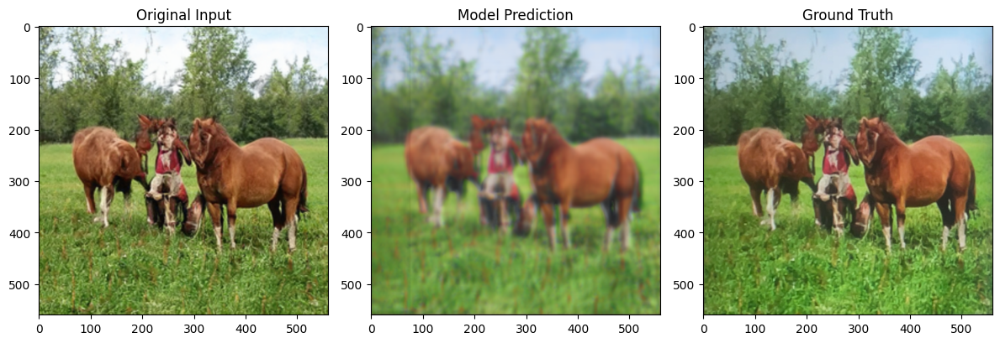

Evaluating unet_L1...
Validation PSNR: 25.1569 dB


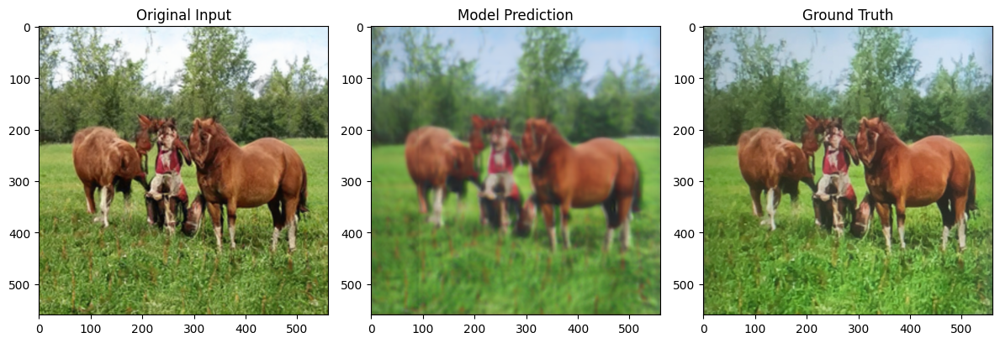

Evaluating unet_MSE+FFL...
Validation PSNR: 24.5357 dB


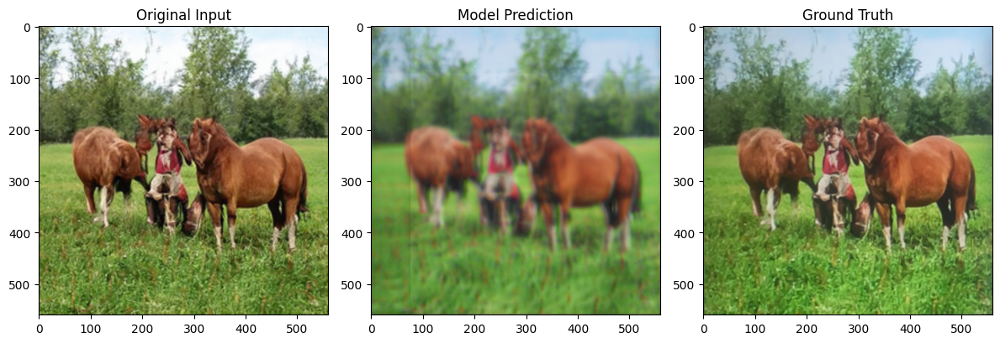

Evaluating unet_L1+FFL...
Validation PSNR: 24.8990 dB


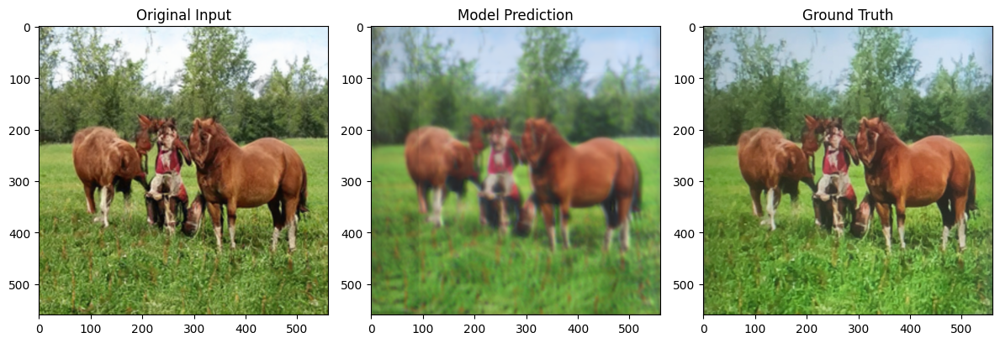

Evaluation complete.


In [ ]:


import os
import json
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T


!pip install --quiet scikit-image
from skimage.metrics import structural_similarity as ssim

model_dir = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project"


# psnr
import math

def compute_psnr(img1, img2):
    """
    img1, img2: torch Tensors in [0,1] range, shape (C,H,W).
    Returns a scalar float PSNR (in dB).
    """
    mse = ((img1 - img2) ** 2).mean().item()
    if mse == 0:
        return 100.0
    psnr = 10 * math.log10(1 / mse)  # Since max pixel val=1
    return psnr


def evaluate_model(model, loader, device):

    model.eval()
    psnr_list = []
    ssim_list = []
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)

            outputs = model(images)
            # Clip or ensure outputs are in [0,1], though
            # well-trained models should mostly be in that range.
            outputs = torch.clamp(outputs, 0, 1)

            for i in range(images.size(0)):
                psnr_val = compute_psnr(outputs[i], targets[i])

                psnr_list.append(psnr_val)


    mean_psnr = np.mean(psnr_list)

    return mean_psnr

def show_example(model, loader, device, model_name, output_dir=model_dir):

    model.eval()
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)
            outputs = model(images)
            outputs = torch.clamp(outputs, 0, 1)


            original  = images[0].cpu().permute(1, 2, 0).numpy()
            predicted = outputs[0].cpu().permute(1, 2, 0).numpy()
            true      = targets[0].cpu().permute(1, 2, 0).numpy()

            plt.figure(figsize=(12,4))
            plt.subplot(1,3,1)
            plt.imshow(np.clip(original, 0, 1))
            plt.title("Original Input")

            plt.subplot(1,3,2)
            plt.imshow(np.clip(predicted, 0, 1))
            plt.title("Model Prediction")

            plt.subplot(1,3,3)
            plt.imshow(np.clip(true, 0, 1))
            plt.title("Ground Truth")

            plt.tight_layout()
            save_name = f"eval_example_{model_name}.png"
            plt.savefig(os.path.join(output_dir, save_name))
            plt.show()
            plt.close()
            break


saved_models = [
    "unet_MSE.pth",
    "unet_L1.pth",
    "unet_MSE+FFL.pth",
    "unet_L1+FFL.pth"
]

for checkpoint_name in saved_models:
    loss_name = checkpoint_name.replace(".pth", "")

    print("="*60)
    print(f"Evaluating {loss_name}...")


    model_path = os.path.join(model_dir, checkpoint_name)
    model = UNet(in_channels=3, out_channels=3).to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()



    val_psnr = evaluate_model(model, val_loader, device)
    print(f"Validation PSNR: {val_psnr:.4f} dB")



    show_example(model, val_loader, device, loss_name)

print("Evaluation complete.")


# 2 REVERSE UNET EXPERIMENT

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda
Total matched pairs: 1200
Training pairs:   960
Validation pairs: 120
Test pairs:       120
Epoch [1/20]: Train Loss = 0.1654, Val  Loss = 0.0858
Epoch [2/20]: Train Loss = 0.0697, Val  Loss = 0.0719
Epoch [3/20]: Train Loss = 0.0537, Val  Loss = 0.0508
Epoch [4/20]: Train Loss = 0.0477, Val  Loss = 0.0463
Epoch [5/20]: Train Loss = 0.0450, Val  Loss = 0.0448
Epoch [6/20]: Train Loss = 0.0437, Val  Loss = 0.0471
Epoch [7/20]: Train Loss = 0.0434, Val  Loss = 0.0451
Epoch [8/20]: Train Loss = 0.0421, Val  Loss = 0.0428
Epoch [9/20]: Train Loss = 0.0415, Val  Loss = 0.0414
Epoch [10/20]: Train Loss = 0.0415, Val  Loss = 0.0411
Epoch [11/20]: Train Loss = 0.0393, Val  Loss = 0.0400
Epoch [12/20]: Train Loss = 0.0390, Val  Loss = 0.0417
Epoch [13/20]: Train Loss = 0.0382, Val  Loss = 0.0387
Epoch [14/20]: Train Loss = 0.0382, Val  Loss = 0.0402

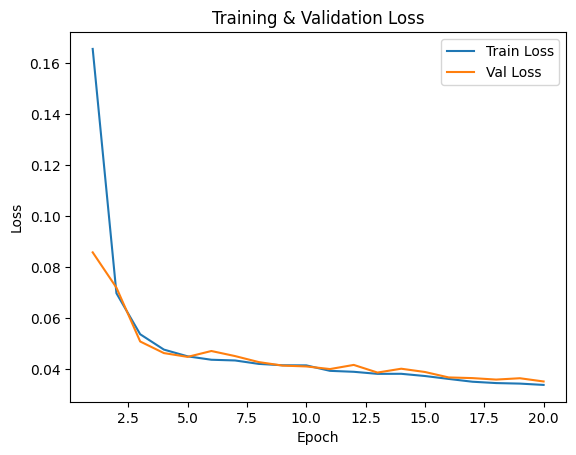

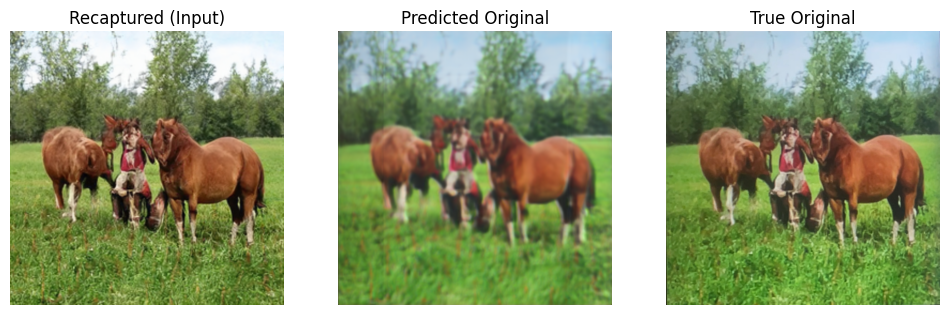

Test MSE:  0.002879
Test PSNR: 25.41 dB  (higher = better)
Model saved to /content/drive/My Drive/School/Year 2024–2025/CS229/final_project/reversed_unet.pth


In [ ]:
import os
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt  # For plotting

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from google.colab import drive


drive.mount('/content/drive')

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


root_orig = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/stylegan2_orig"
root_recap = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/ROSE Dataset/Chimera/data/recap_monitor"

subfolders = ["cat", "church", "horse"]
subsubfolders = ["0_real", "1_fake"]

def gather_image_pairs(root_original, root_recap, subfolders):
    valid_ext = ('.png', '.jpg', '.jpeg')

    pairs = []
    for sub in subfolders:
      for subsub in subsubfolders:
        orig_sub_path = os.path.join(root_original, sub)
        orig_sub_path = os.path.join(orig_sub_path, subsub)
        recap_sub_path = os.path.join(root_recap, sub)
        recap_sub_path = os.path.join(recap_sub_path, subsub)


        orig_fnames = sorted([
            f for f in os.listdir(orig_sub_path)
            if f.lower().endswith(valid_ext)
        ])
        recap_fnames = sorted([
            f for f in os.listdir(recap_sub_path)
            if f.lower().endswith(valid_ext)
        ])


        recap_dict = {f: os.path.join(recap_sub_path, f) for f in recap_fnames}


        for fname in orig_fnames:
            if fname in recap_dict:
                orig_full = os.path.join(orig_sub_path, fname)
                recap_full = recap_dict[fname]
                pairs.append((orig_full, recap_full))
            else:
                print(f"Warning: no matching recaptured file for {fname} in subfolder '{sub}'")
    return pairs

# FLIPPED
filename_pairs = gather_image_pairs(root_recap, root_orig, subfolders)
random.shuffle(filename_pairs)

print(f"Total matched pairs: {len(filename_pairs)}")


n_total   = len(filename_pairs)
train_end = int(0.8 * n_total)
val_end   = int(0.9 * n_total)

train_pairs = filename_pairs[:train_end]
val_pairs   = filename_pairs[train_end:val_end]
test_pairs  = filename_pairs[val_end:]

print(f"Training pairs:   {len(train_pairs)}")
print(f"Validation pairs: {len(val_pairs)}")
print(f"Test pairs:       {len(test_pairs)}")

class OriginalToRecapturedDataset(Dataset):
    def __init__(self, pairs, transform=None):
        """
        pairs: list of (original_image_path, recaptured_image_path)
        transform: torchvision transform (resize, to_tensor, etc.)
        """
        self.pairs = pairs
        self.transform = transform

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        orig_path, recap_path = self.pairs[idx]

        orig_img = Image.open(orig_path).convert('RGB')
        recap_img = Image.open(recap_path).convert('RGB')

        if self.transform:
            orig_img = self.transform(orig_img)
            recap_img = self.transform(recap_img)


        return recap_img, orig_img

IMG_HEIGHT = 560
IMG_WIDTH  = 560
BATCH_SIZE = 8
EPOCHS = 20  # Adjust as needed

transform = T.Compose([
    T.Resize((IMG_HEIGHT, IMG_WIDTH)),
    T.ToTensor(),
])

train_dataset = OriginalToRecapturedDataset(train_pairs, transform=transform)
val_dataset   = OriginalToRecapturedDataset(val_pairs,   transform=transform)
test_dataset  = OriginalToRecapturedDataset(test_pairs,  transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(UNet, self).__init__()

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder
        self.down1 = DoubleConv(in_channels, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)

        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        d1 = self.down1(x)      # (N, 64, H, W)
        p1 = self.maxpool(d1)   # (N, 64, H/2, W/2)
        d2 = self.down2(p1)     # (N, 128, H/2, W/2)
        p2 = self.maxpool(d2)   # (N, 128, H/4, W/4)
        d3 = self.down3(p2)     # (N, 256, H/4, W/4)
        p3 = self.maxpool(d3)   # (N, 256, H/8, W/8)
        d4 = self.down4(p3)     # (N, 512, H/8, W/8)
        p4 = self.maxpool(d4)   # (N, 512, H/16, W/16)

        # Bottleneck
        b = self.bottleneck(p4) # (N, 1024, H/16, W/16)

        # Decoder
        up_4 = self.up4(b)                    # (N, 512, H/8, W/8)
        cat_4 = torch.cat([up_4, d4], dim=1)  # (N, 1024, H/8, W/8)
        dec_4 = self.dec4(cat_4)              # (N, 512, H/8, W/8)

        up_3 = self.up3(dec_4)                # (N, 256, H/4, W/4)
        cat_3 = torch.cat([up_3, d3], dim=1)  # (N, 512, H/4, W/4)
        dec_3 = self.dec3(cat_3)              # (N, 256, H/4, W/4)

        up_2 = self.up2(dec_3)                # (N, 128, H/2, W/2)
        cat_2 = torch.cat([up_2, d2], dim=1)  # (N, 256, H/2, W/2)
        dec_2 = self.dec2(cat_2)              # (N, 128, H/2, W/2)

        up_1 = self.up1(dec_2)                # (N, 64, H, W)
        cat_1 = torch.cat([up_1, d1], dim=1)  # (N, 128, H, W)
        dec_1 = self.dec1(cat_1)              # (N, 64, H, W)

        out = self.out(dec_1)                 # (N, out_channels, H, W)
        return out


model = UNet(in_channels=3, out_channels=3).to(device)

criterion = nn.L1Loss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0
    for images, targets in loader:
        images = images.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

def validate_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets.to(device)

            outputs = model(images)
            loss = criterion(outputs, targets)
            running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss


train_losses = []
val_losses   = []

for epoch in range(1, EPOCHS + 1):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss   = validate_one_epoch(model, val_loader, criterion, device)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch [{epoch}/{EPOCHS}]: Train Loss = {train_loss:.4f}, Val  Loss = {val_loss:.4f}")


plt.figure()
plt.plot(range(1, EPOCHS+1), train_losses, label='Train Loss')
plt.plot(range(1, EPOCHS+1), val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.show()



model.eval()
example_images, example_targets = next(iter(val_loader))
example_images = example_images.to(device)
with torch.no_grad():
    example_outputs = model(example_images)

# Convert tensors to CPU for plotting
example_images  = example_images.cpu()
example_targets = example_targets.cpu()
example_outputs = example_outputs.cpu()


idx = 0
recap_img  = example_images[idx].permute(1,2,0).numpy()
pred_output = example_outputs[idx].permute(1,2,0).numpy()
true_orig   = example_targets[idx].permute(1,2,0).numpy()


recap_img  = np.clip(recap_img,  0, 1)
pred_output = np.clip(pred_output, 0, 1)
true_orig   = np.clip(true_orig, 0, 1)

fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(recap_img)
axs[0].set_title('Recaptured (Input)')
axs[0].axis('off')

axs[1].imshow(pred_output)
axs[1].set_title('Predicted Original')
axs[1].axis('off')

axs[2].imshow(true_orig)
axs[2].set_title('True Original')
axs[2].axis('off')

plt.show()

def compute_psnr(mse):

    if mse == 0:
        return 100  # Arbitrarily large PSNR if MSE=0
    return 10 * np.log10(1.0 / mse)

model.eval()
test_mse = 0.0
count = 0

with torch.no_grad():
    for images, targets in test_loader:
        images = images.to(device)
        targets = targets.to(device)

        outputs = model(images)
        batch_mse = F.mse_loss(outputs, targets, reduction='mean').item()
        test_mse += batch_mse
        count += 1


test_mse_avg = test_mse / count

test_psnr_avg = compute_psnr(test_mse_avg)

print(f"Test MSE:  {test_mse_avg:.6f}")
print(f"Test PSNR: {test_psnr_avg:.2f} dB  (higher = better)")


save_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/reversed_unet.pth"
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")


# FINAL EVALUATION

In [ ]:

import copy
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset, random_split
from PIL import Image
import os
from tqdm import tqdm
import logging
import matplotlib.pyplot as plt
import pandas as pd
import sys
import random
import numpy as np
import cv2

# transforms
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')



class DoubleConv(nn.Module):
    """(Conv2D -> ReLU -> Conv2D -> ReLU)"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(UNet, self).__init__()

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder
        self.down1 = DoubleConv(in_channels, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)

        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)

        # Decoder
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.maxpool(d1)
        d2 = self.down2(p1)
        p2 = self.maxpool(d2)
        d3 = self.down3(p2)
        p3 = self.maxpool(d3)
        d4 = self.down4(p3)
        p4 = self.maxpool(d4)

        b = self.bottleneck(p4)

        up_4 = self.up4(b)
        cat_4 = torch.cat([up_4, d4], dim=1)
        dec_4 = self.dec4(cat_4)

        up_3 = self.up3(dec_4)
        cat_3 = torch.cat([up_3, d3], dim=1)
        dec_3 = self.dec3(cat_3)

        up_2 = self.up2(dec_3)
        cat_2 = torch.cat([up_2, d2], dim=1)
        dec_2 = self.dec2(cat_2)

        up_1 = self.up1(dec_2)
        cat_1 = torch.cat([up_1, d1], dim=1)
        dec_1 = self.dec1(cat_1)

        out = self.out(dec_1)
        return out

class RecaptureResNet(nn.Module):
    def __init__(self, resnet_version=18):
        super(RecaptureResNet, self).__init__()
        resnet_models = {
            18: models.resnet18,
            34: models.resnet34,
            50: models.resnet50,
            101: models.resnet101,
            152: models.resnet152,
        }
        # Load the pretrained ResNet model (default 3-channel input)
        self.model = resnet_models[resnet_version](pretrained=True)

        # Modify the fully connected layer for binary classification
        num_features = self.model.fc.in_features
        self.model.fc = nn.Linear(num_features, 1)

    def forward(self, x):
        return self.model(x)

reverse_network_load_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/reversed_unet.pth"
reverse_network_model = UNet(in_channels=3, out_channels=3).to(device)
reverse_network_model.load_state_dict(torch.load(reverse_network_load_path, map_location=device))
reverse_network_model.eval()

camera_sim_load_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/unet_L1.pth"
camera_sim_model = UNet(in_channels=3, out_channels=3).to(device)
camera_sim_model.load_state_dict(torch.load(camera_sim_load_path, map_location=device))
camera_sim_model.eval()

detector_load_path = "/content/drive/My Drive/School/Year 2024–2025/CS229/final_project/recapture_resnet50.pth"
detector_model = RecaptureResNet(resnet_version=50).to(device)
detector_model.load_state_dict(torch.load(detector_load_path, map_location=device))
detector_model.eval()

# test this guy out
example_images, example_targets = next(iter(val_loader))
example_targets = example_targets.to(device)

sim_adversarial_input = reverse_network_model(example_targets)
rebroadcast_sim_output = camera_sim_model(sim_adversarial_input)
rebroadcast_sim_output = rebroadcast_sim_output[:, :, 153:377, 153:377]
output = detector_model(rebroadcast_sim_output)
print(output)

tensor([[-6.5859],
        [-5.7072],
        [-5.0063],
        [-7.1473],
        [-5.1985],
        [-6.4409],
        [-5.8214],
        [-4.9571]], device='cuda:0', grad_fn=<AddmmBackward0>)


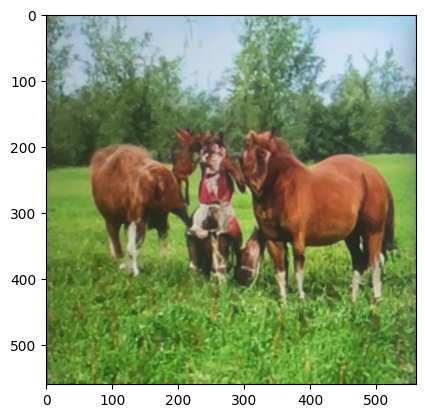

tensor([[-6.5859],
        [-5.7072],
        [-5.0063],
        [-7.1473],
        [-5.1985],
        [-6.4409],
        [-5.8214],
        [-4.9571]], device='cuda:0', grad_fn=<AddmmBackward0>)


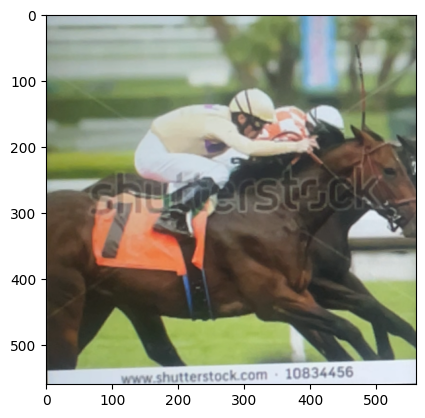

tensor([[-4.6261],
        [-4.8122],
        [-6.7098],
        [-5.5083],
        [-5.6290],
        [-4.1525],
        [-5.3374],
        [-5.6067]], device='cuda:0', grad_fn=<AddmmBackward0>)


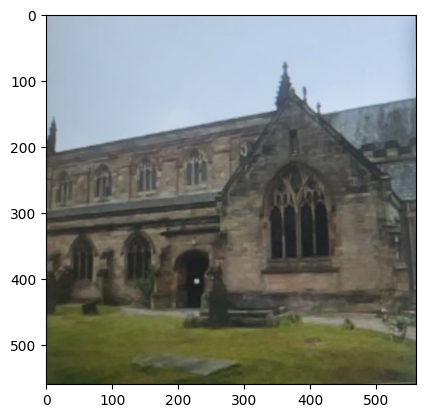

tensor([[-5.8369],
        [-4.6272],
        [-5.1791],
        [-5.2717],
        [-5.2477],
        [-5.7749],
        [-5.3883],
        [-3.9463]], device='cuda:0', grad_fn=<AddmmBackward0>)


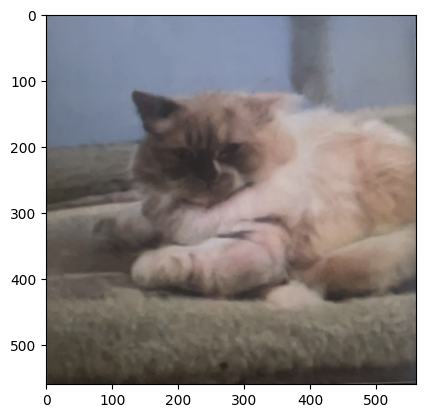

tensor([[-4.9999],
        [-5.2336],
        [-4.8777],
        [-4.3366],
        [-5.0083],
        [-4.7142],
        [-5.3079],
        [-6.4781]], device='cuda:0', grad_fn=<AddmmBackward0>)


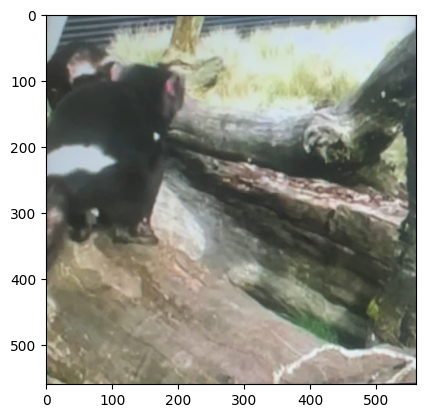

tensor([[-5.8555],
        [-5.4680],
        [-5.0875],
        [-5.1890],
        [-3.6585],
        [-5.6563],
        [-3.8225],
        [-4.8475]], device='cuda:0', grad_fn=<AddmmBackward0>)


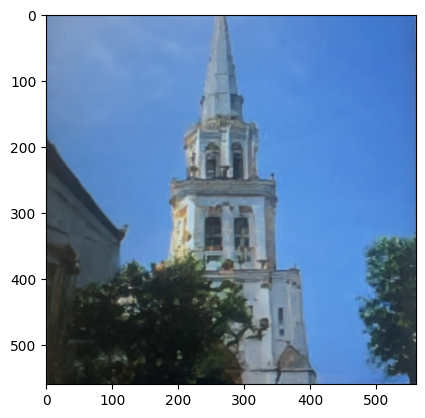

tensor([[-5.2651],
        [-5.7707],
        [-5.4748],
        [-5.0300],
        [-5.8612],
        [-5.9745],
        [-5.2498],
        [-5.5591]], device='cuda:0', grad_fn=<AddmmBackward0>)


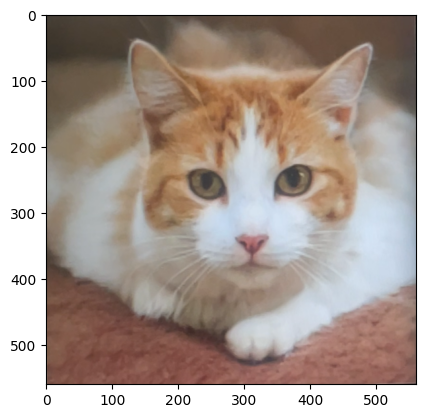

tensor([[-3.1756],
        [-5.3050],
        [-4.7309],
        [-4.8218],
        [-5.5411],
        [-4.7081],
        [-5.1918],
        [-6.2163]], device='cuda:0', grad_fn=<AddmmBackward0>)


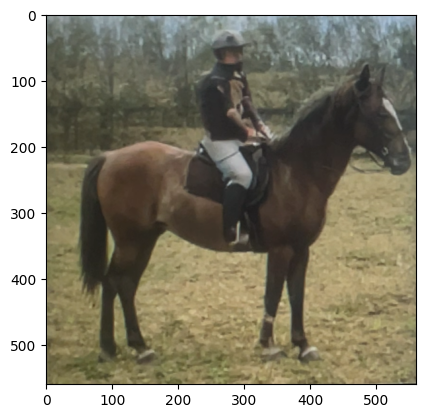

tensor([[-5.3368],
        [-4.8956],
        [-6.9196],
        [-6.3425],
        [-5.5349],
        [-5.4089],
        [-5.9563],
        [-4.7950]], device='cuda:0', grad_fn=<AddmmBackward0>)


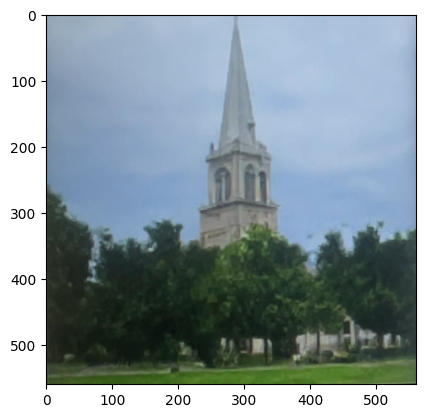

tensor([[-6.1709],
        [-5.1616],
        [-5.1181],
        [-5.3413],
        [-5.6440],
        [-4.7483],
        [-5.8974],
        [-4.6096]], device='cuda:0', grad_fn=<AddmmBackward0>)


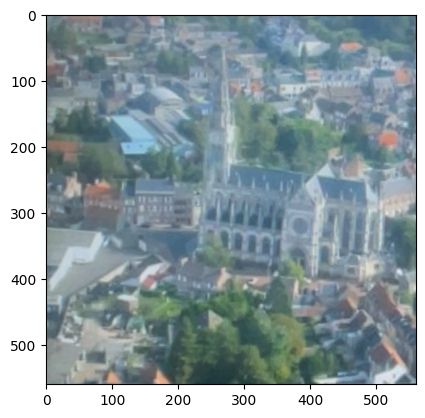

tensor([[-5.5221],
        [-5.4521],
        [-5.3232],
        [-2.5577],
        [-5.2310],
        [-4.5297],
        [-4.4441],
        [-5.3906]], device='cuda:0', grad_fn=<AddmmBackward0>)


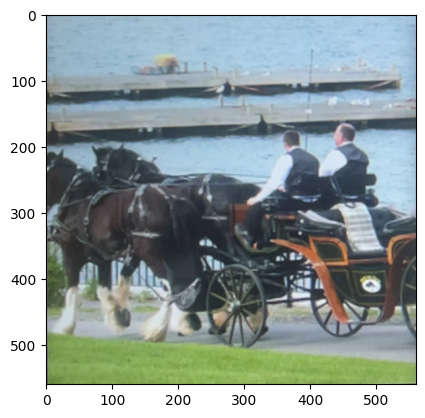

tensor([[-4.3457],
        [-5.9245],
        [-4.9511],
        [-5.1373],
        [-4.4153],
        [-6.0813],
        [-4.5384],
        [-4.8436]], device='cuda:0', grad_fn=<AddmmBackward0>)


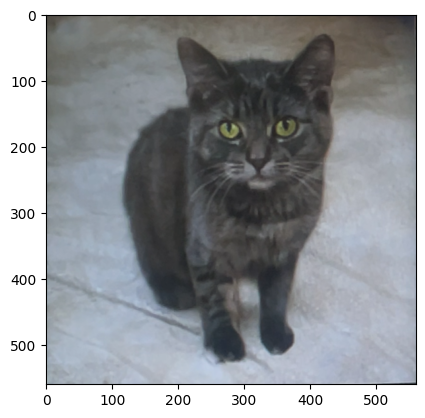

tensor([[-6.0715],
        [-5.6263],
        [-5.3472],
        [-5.0451],
        [-4.5742],
        [-4.7944],
        [-4.0493],
        [-5.5596]], device='cuda:0', grad_fn=<AddmmBackward0>)


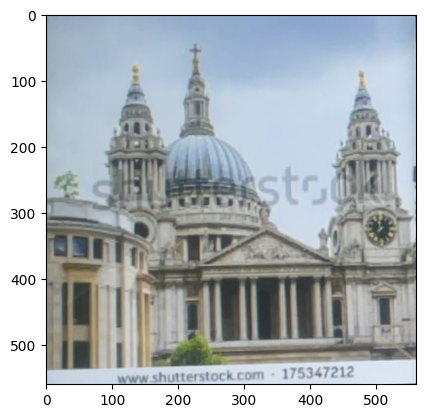

tensor([[-5.7211],
        [-5.2252],
        [-5.1573],
        [-6.2845],
        [-6.5808],
        [-4.4410],
        [-3.3121],
        [-5.4207]], device='cuda:0', grad_fn=<AddmmBackward0>)


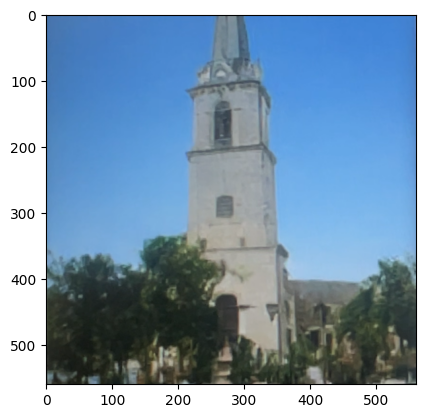

tensor([[-5.0615],
        [-4.3548],
        [-5.2764],
        [-5.5518],
        [-6.0359],
        [-4.7648],
        [-5.1550],
        [-5.5930]], device='cuda:0', grad_fn=<AddmmBackward0>)


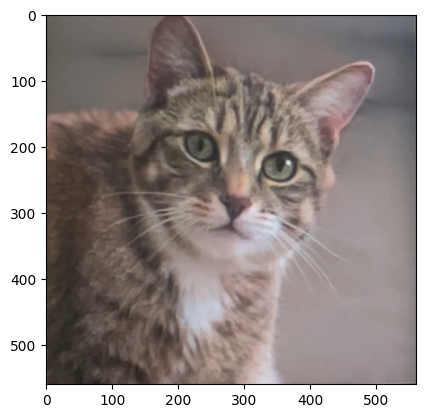

tensor([[-4.7050],
        [-4.6801],
        [-5.0800],
        [-4.8081],
        [-5.3723],
        [-4.2673],
        [-4.0058],
        [-4.9674]], device='cuda:0', grad_fn=<AddmmBackward0>)


In [ ]:
for example_images, example_targets in val_loader:
  # 1. Take the first image from the batch
  example_targets = example_targets.to(device)
  image = example_targets[0]


  image = image.permute(1, 2, 0)


  image = image.cpu().numpy()


  plt.imshow(image)
  plt.show()

  sim_adversarial_input = reverse_network_model(example_targets)
  rebroadcast_sim_output = camera_sim_model(sim_adversarial_input)
  rebroadcast_sim_output = rebroadcast_sim_output[:, :, 153:377, 153:377]
  output = detector_model(rebroadcast_sim_output)
  print(output)

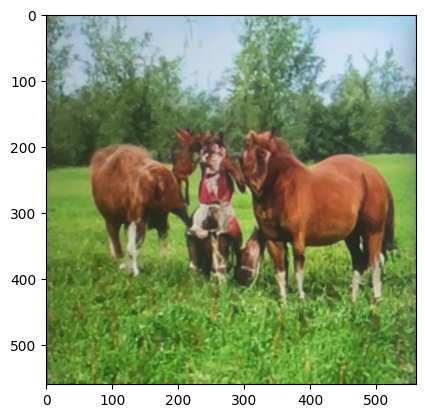

In [ ]:
import torch
import matplotlib.pyplot as plt


image = example_targets[0]


image = image.permute(1, 2, 0)


image = image.cpu().numpy()

plt.imshow(image)
plt.show()
